#Notebook for NLU project

This notebook contains the source code of the models that were analyzed. In particular these models were analyzed:

- Simple LSTM from LAB 10
- Improved BiLSTM with specific Loss function and loss weighting
- BERT fine tuning

The notebook contains a header with some initialization and then each section contains the corrisponding model with results on both ATIS and SNIPS. A better distributed version of ATIS is tested as well

###Task 

The task to perform both **Slot filling** and **Intent classification** tasks.

In the literature there are proofs that models trained jointly on both tasks perform better than individual task specific models. 

####Slot filling
The sequence labelling task is defined as:
- Given a sequence of tokens $w = {w_1, w_2, ..., w_n}$,
- defining a sequence of labels as $l = {l_1, l_2, ..., l_n}$
- compute the sequence $\hat{l}$ such as $\hat{l} = \underset{l}{\operatorname{argmax}} P(l|w)$ 

\
An example from ATIS dataset is the following: 

| Slot Filling | | | | | | | | | | | | | |
|----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |
| Input sequence: |i |'d |like |to |see |all |the |economy |fares |from |baltimore |to | philadelphia|
| Output sequence: | O |O |O |O |O |O |O |B-economy |O |O |B-fromloc.city_name |O |B-toloc.city_name|



####Intent classification
The intent classification problem is defined as follows:
- Given a sequence of tokens $w = {w_1, w_2, ..., w_n}$,
- And a set of labels $L$ where $l \in L$
- estimate the label $\hat{l}$ such as $\hat{l} = \underset{l}{\operatorname{argmax}} P(l|w)$ 

An example from ATIS dataset is the following:

| Intent Classification | | | | | | | | | | | | | |
|----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |
| Input sequence: |i |'d |like |to |see |all |the |economy |fares |from |baltimore |to | philadelphia|
| Output label: | airfare |



###Dataset
The datasets that are used in the evaluation are ATIS (Airline Travel Information Systems) and SNIPS

####ATIS

Airline Travel Information Systems (ATIS) dataset is made of entries as such

```json
[
    {
        "utterance": "i want to fly from boston at 838 am and arrive in denver at 1110 in the morning",
        "slots": "O O O O O B-fromloc.city_name O B-depart_time.time I-depart_time.time O O O B-toloc.city_name O B-arrive_time.time O O B-arrive_time.period_of_day",
        "intent": "flight"
    },
    ...
]
```

####SNIPS

SNIPS dataset is made of entries as such

```json
[
    {
        "utterance": "listen to westbam alumb allergic on google music",
        "slots": "O O B-artist O B-album O B-service I-service",
        "intent": "PlayMusic"
    },
    ...
 ]
```

# Setup
In this part of the notebook, the initial setup is done.

That includes:

- Install required libraries
- Required imports
- Dataset loading and stratified splitting
- Other utility functions used through the notebook

In [1]:
##install transformers, which is required for BERT and AlBERT
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.7 MB 5.1 MB/s 
     |████████████████████████████████| 101 kB 9.0 MB/s 
     |████████████████████████████████| 6.6 MB 37.1 MB/s 
     |████████████████████████████████| 596 kB 45.0 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [2]:
##classic  libraries
import os
import json
from pprint import pprint
import random
import numpy as np
from collections import Counter
from copy import deepcopy
from collections import OrderedDict

##data plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd

##train test splitting library form sklearn
from sklearn.model_selection import train_test_split
##confusion matrix from sklearn
from sklearn.metrics import confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix

##import of torch libraries for neural networks
import torch
import torch.nn as nn
import torch.utils.data as data
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence
import torch.optim as optim

##BERT and AlBERT
from transformers import BertTokenizer,BertModel

##evaluation
from sklearn.metrics import classification_report
##tqdm
from tqdm import tqdm
##custom evaluate from conll script
from conll import evaluate

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  
print(device)
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
PAD_TOKEN = 0
UNK_TOKEN = 1

##unzip dataset in the current folder. Requires to insert the dataset here
! rm -rf data
! unzip data.zip

cuda
Archive:  data.zip
   creating: data/
   creating: data/ATIS/
   creating: data/ATIS/original/
  inflating: data/ATIS/original/atis.test.ctf  
  inflating: data/ATIS/original/atis.train.ctf  
  inflating: data/ATIS/test.json     
  inflating: data/ATIS/train.json    
  inflating: data/README.md          
   creating: data/SNIPS/
   creating: data/SNIPS/original/
   creating: data/SNIPS/original/test/
  inflating: data/SNIPS/original/test/label  
  inflating: data/SNIPS/original/test/seq.in  
  inflating: data/SNIPS/original/test/seq.out  
   creating: data/SNIPS/original/train/
  inflating: data/SNIPS/original/train/label  
  inflating: data/SNIPS/original/train/seq.in  
  inflating: data/SNIPS/original/train/seq.out  
   creating: data/SNIPS/original/valid/
  inflating: data/SNIPS/original/valid/label  
  inflating: data/SNIPS/original/valid/seq.in  
  inflating: data/SNIPS/original/valid/seq.out  
  inflating: data/SNIPS/test.json    
  inflating: data/SNIPS/train.json   
  infl

###Dataset preparation

This part is dedicated to prepare the dataset, from reading it from file to 

####Dataset reader

Dataset reader function for both ATIS and SNIPS

In [3]:
##dataset JSON reader
def load_data(path):
    '''
    input: path/to/data
    output: json 
    '''
    dataset = []
    with open(path) as f:
        dataset = json.loads(f.read())
    return dataset

In [4]:
##create two raw datasets

tmp_train_raw_ATIS = load_data(os.path.join('data','ATIS','train.json'))
test_raw_ATIS = load_data(os.path.join('data','ATIS','test.json'))
print('Train samples ATIS:', len(tmp_train_raw_ATIS))
print('Test samples ATIS:', len(test_raw_ATIS))

tmp_train_raw_SNIPS = load_data(os.path.join('data','SNIPS','train.json'))
test_raw_SNIPS = load_data(os.path.join('data','SNIPS','test.json'))
print('Train samples SNIPS:', len(tmp_train_raw_SNIPS))
print('Test samples SNIPS:', len(test_raw_SNIPS))

Train samples ATIS: 4978
Test samples ATIS: 893
Train samples SNIPS: 13084
Test samples SNIPS: 700


####Dev set
In the original split the developement set is missing. To train and find the best hyperparameter of our network the dev set is fundamental. Therefore it is required to create it starting from the **traning** set by doing a stratified sampling from training set.

In [5]:
##function to split dataset in train,dev and test
def dataset_split(tmp_train_raw,test_raw):
    '''
    input: tmp_train_raw,test_raw two datasets for train and test
    output: train_raw,dev_raw,test_raw three datasets splitted correctly
    '''
    ##First we get the 10% of dataset, then we compute the percentage of these examples 
    portion = round(((len(tmp_train_raw) + len(test_raw)) * 0.10)/(len(tmp_train_raw)),2)
    ##Stratify as cross validation
    intents = [x['intent'] for x in tmp_train_raw]
    count_y = Counter(intents)
    Y = []
    X = []
    mini_Train = []
    for id_y, y in enumerate(intents):
        if count_y[y] > 1: ##Some intents have only one instance, we put them in training
            X.append(tmp_train_raw[id_y])
            Y.append(y)
        else:
            mini_Train.append(tmp_train_raw[id_y])
    ##Random Stratify -> cross validation
    X_train, X_dev, y_train, y_dev = train_test_split(X, Y, test_size=portion, random_state=26, shuffle=True,stratify=Y)
    ##We add the examples with only one instance
    X_train.extend(mini_Train)
    train_raw = X_train
    dev_raw = X_dev

    return train_raw,dev_raw,test_raw


In [6]:
train_raw_ATIS,dev_raw_ATIS,test_raw_ATIS = dataset_split(tmp_train_raw_ATIS,test_raw_ATIS)
##Dataset size ATIS
print('TRAIN size ATIS:', len(train_raw_ATIS))
print('DEV size ATIS:', len(dev_raw_ATIS))
print('TEST size ATIS:', len(test_raw_ATIS))

print('')
train_raw_SNIPS,dev_raw_SNIPS,test_raw_SNIPS = dataset_split(tmp_train_raw_SNIPS,test_raw_SNIPS)
##Dataset size SNIPS
print('TRAIN size SNIPS:', len(train_raw_SNIPS))
print('DEV size SNIPS:', len(dev_raw_SNIPS))
print('TEST size SNIPS:', len(test_raw_SNIPS))

TRAIN size ATIS: 4381
DEV size ATIS: 597
TEST size ATIS: 893

TRAIN size SNIPS: 11644
DEV size SNIPS: 1440
TEST size SNIPS: 700


#### Train Dev Test Slot and Intent distribution

In [7]:
def slot_intent_distribution(train_raw,dev_raw,test_raw):

    y_train_slot = [l for x in train_raw for l in x['slots'].split()]
    y_dev_slot = [l for x in dev_raw for l in x['slots'].split()]
    y_test_slot = [l for x in test_raw for l in x['slots'].split()]

    ## slots distribution
    print('Train:')
    pprint({k:round(v/len(y_train_slot),3)*100 for k, v in sorted(Counter(y_train_slot).items())})
    print('Dev:'), 
    pprint({k:round(v/len(y_dev_slot),3)*100 for k, v in sorted(Counter(y_dev_slot).items())})
    print('Test:') 
    pprint({k:round(v/len(y_test_slot),3)*100 for k, v in sorted(Counter(y_test_slot).items())})
    print('='*89)

    train_slot = set(y_train_slot)
    dev_slot = set(y_dev_slot)
    test_slot = set(y_test_slot)

    print('Slot labels that occour in dev but not in train')
    pprint(dev_slot.difference(train_slot))
    print('Slot labels that occour in test but not in train')
    pprint(test_slot.difference(train_slot))
    print('Slot labels that occour in test but not in train or dev')
    pprint(test_slot.difference(train_slot.union(dev_slot)))
    
    y_train_intent = [x['intent'] for x in train_raw]
    y_dev_intent = [x['intent'] for x in dev_raw]
    y_test_intent = [x['intent'] for x in test_raw]

    ##Intent distribution
    print('Train:')
    pprint({k:round(v/len(y_train_intent),3)*100 for k, v in sorted(Counter(y_train_intent).items())})
    print('Dev:'), 
    pprint({k:round(v/len(y_dev_intent),3)*100 for k, v in sorted(Counter(y_dev_intent).items())})
    print('Test:')
    pprint({k:round(v/len(y_test_intent),3)*100 for k, v in sorted(Counter(y_test_intent).items())})
    print('='*89)
    train_intent = set(y_train_intent)
    dev_intent = set(y_dev_intent)
    test_intent = set(y_test_intent)
    print('Intent labels that occour in dev but not in train')
    pprint(dev_intent.difference(train_intent))
    print('Intent labels that occour in test but not in train')
    pprint(test_intent.difference(train_intent))
    print('Intent labels that occour in test but not in train or dev')
    pprint(test_intent.difference(train_intent.union(dev_intent)))

In [8]:
slot_intent_distribution(train_raw_ATIS,dev_raw_ATIS,test_raw_ATIS)

Train:
{'B-aircraft_code': 0.1,
 'B-airline_code': 0.2,
 'B-airline_name': 1.2,
 'B-airport_code': 0.1,
 'B-airport_name': 0.1,
 'B-arrive_date.date_relative': 0.0,
 'B-arrive_date.day_name': 0.2,
 'B-arrive_date.day_number': 0.1,
 'B-arrive_date.month_name': 0.1,
 'B-arrive_date.today_relative': 0.0,
 'B-arrive_time.end_time': 0.0,
 'B-arrive_time.period_mod': 0.0,
 'B-arrive_time.period_of_day': 0.1,
 'B-arrive_time.start_time': 0.0,
 'B-arrive_time.time': 0.4,
 'B-arrive_time.time_relative': 0.3,
 'B-city_name': 0.4,
 'B-class_type': 0.4,
 'B-connect': 0.1,
 'B-cost_relative': 0.6,
 'B-day_name': 0.0,
 'B-day_number': 0.0,
 'B-days_code': 0.0,
 'B-depart_date.date_relative': 0.1,
 'B-depart_date.day_name': 1.6,
 'B-depart_date.day_number': 0.7000000000000001,
 'B-depart_date.month_name': 0.6,
 'B-depart_date.today_relative': 0.2,
 'B-depart_date.year': 0.0,
 'B-depart_time.end_time': 0.0,
 'B-depart_time.period_mod': 0.1,
 'B-depart_time.period_of_day': 1.0999999999999999,
 'B-depar

In [9]:
slot_intent_distribution(train_raw_SNIPS,dev_raw_SNIPS,test_raw_SNIPS)

Train:
{'B-album': 0.1,
 'B-artist': 1.5,
 'B-best_rating': 0.8999999999999999,
 'B-city': 1.0999999999999999,
 'B-condition_description': 0.4,
 'B-condition_temperature': 0.4,
 'B-country': 0.7000000000000001,
 'B-cuisine': 0.2,
 'B-current_location': 0.2,
 'B-entity_name': 0.5,
 'B-facility': 0.1,
 'B-genre': 0.1,
 'B-geographic_poi': 0.2,
 'B-location_name': 0.5,
 'B-movie_name': 0.7000000000000001,
 'B-movie_type': 0.6,
 'B-music_item': 1.3,
 'B-object_location_type': 0.4,
 'B-object_name': 2.4,
 'B-object_part_of_series_type': 0.3,
 'B-object_select': 0.8,
 'B-object_type': 2.6,
 'B-party_size_description': 0.3,
 'B-party_size_number': 0.8,
 'B-playlist': 1.7000000000000002,
 'B-playlist_owner': 0.8999999999999999,
 'B-poi': 0.1,
 'B-rating_unit': 0.8999999999999999,
 'B-rating_value': 1.6,
 'B-restaurant_name': 0.3,
 'B-restaurant_type': 1.0999999999999999,
 'B-served_dish': 0.2,
 'B-service': 0.6,
 'B-sort': 0.4,
 'B-spatial_relation': 1.0,
 'B-state': 0.8,
 'B-timeRange': 1.6,


####Lang class
This class is used to map unique ids to tokens, intents and slots as in a deep model it is required to used numbers and not strings. 

The mapping is a unique progessive number for each unique token, intent, slot


**Original**
```json
[
    {
      "intent": "flight",
      "slots": "O O O O B-fromloc.city_name O B-toloc.city_name B-toloc.state_name",
      "utterance": "which flights are between boston and baltimore washington"},
    ...
]
```
**Mapped**

```json
[
    {
      "intent": "23",
      "slots": "tensor([67, 67, 67, 67, 12, 67,  7, 51], dtype=torch.int32)",
      "utterance": "tensor([2, 3, 4, 5, 6, 7, 8, 9], dtype=torch.int32)"
      },
    ...
]
```

In [10]:
class Lang():
    def __init__(self, words, intents, slots, cutoff=0):
        self.word2id = self.w2id(words, cutoff=cutoff, unk=True)
        self.slot2id = self.lab2id(slots)
        self.intent2id = self.lab2id(intents, pad=False)
        # sorting
        self.word2id = {k: v for k, v in sorted(self.word2id.items(), key=lambda item: item[0])}
        self.slot2id = {k: v for k, v in sorted(self.slot2id.items(), key=lambda item: item[0])}
        self.intent2id = {k: v for k, v in sorted(self.intent2id.items(), key=lambda item: item[0])}
        # reverse
        self.id2word = {v:k for k, v in self.word2id.items()}
        self.id2slot = {v:k for k, v in self.slot2id.items()}
        self.id2intent = {v:k for k, v in self.intent2id.items()}
    def w2id(self, elements, cutoff=None, unk=True):
        vocab = {'[PAD]': PAD_TOKEN}
        if unk:
            vocab['[UNK]'] = len(vocab)
        count = Counter(elements)
        for k, v in count.items():
            if v > cutoff:
                vocab[k] = len(vocab)
        return vocab
    
    def lab2id(self, elements, pad=True):
        vocab = {}
        if pad:
            vocab['[PAD]'] = PAD_TOKEN
        for elem in elements:
                vocab[elem] = len(vocab)
        return vocab

In [11]:
##ATIS processing
words_ATIS = sum([x['utterance'].split() for x in train_raw_ATIS], []) ##No set() since we want to computethe cutoff
corpus_ATIS = train_raw_ATIS + dev_raw_ATIS + test_raw_ATIS ##We do not want unk labels
slots_ATIS = set(sum([line['slots'].split() for line in corpus_ATIS],[]))
intents_ATIS = set([line['intent'] for line in corpus_ATIS])
lang_ATIS = Lang(words_ATIS, intents_ATIS, slots_ATIS, cutoff=0)
##SNIPS processing
words_SNIPS = sum([x['utterance'].split() for x in train_raw_SNIPS], []) ##No set() since we want to computethe cutoff
corpus_SNIPS = train_raw_SNIPS + dev_raw_SNIPS + test_raw_SNIPS ##We do not want unk labels
slots_SNIPS = set(sum([line['slots'].split() for line in corpus_SNIPS],[]))
intents_SNIPS = set([line['intent'] for line in corpus_SNIPS])
lang_SNIPS = Lang(words_SNIPS, intents_SNIPS, slots_SNIPS, cutoff=0)

In [12]:
##ATIS
print(f"n° Words ATIS : {len(lang_ATIS.word2id)}")
print(f"n° Slots ATIS : {len(lang_ATIS.slot2id)}")
print(f"n° Intents ATIS : {len(lang_ATIS.intent2id)}")

##SNIPS
print(f"n° Words SNIPS : {len(lang_SNIPS.word2id)}")
print(f"n° Slots SNIPS : {len(lang_SNIPS.slot2id)}")
print(f"n° Intents SNIPS : {len(lang_SNIPS.intent2id)}")

n° Words ATIS : 853
n° Slots ATIS : 130
n° Intents ATIS : 26
n° Words SNIPS : 10638
n° Slots SNIPS : 73
n° Intents SNIPS : 7


####Dataset class

This class is an subclass of pytorch Dataset. It is used to load correctly the data. 

Implements `__len__()` and  `__getitem__()` which are required in Dataset





In [13]:
##extend dataset as normal dataset and dataloader
class IntentsAndSlots (data.Dataset):
    ##Mandatory methods are __init__, __len__ and __getitem__
    def __init__(self, dataset, lang, unk='[UNK]'):
        self.utterances = []
        self.intents = []
        self.slots = []
        self.unk = unk
        for x in dataset:
            self.utterances.append(x['utterance'])
            self.slots.append(x['slots'])
            self.intents.append(x['intent'])
        self.utt_ids = self.mapping_seq(self.utterances, lang.word2id)
        self.slot_ids = self.mapping_seq(self.slots, lang.slot2id)
        self.intent_ids = self.mapping_lab(self.intents, lang.intent2id)

    def __len__(self):
        return len(self.utterances)

    def __getitem__(self, idx):
        utt = torch.tensor(self.utt_ids[idx],dtype=torch.int)
        slots = torch.tensor(self.slot_ids[idx],dtype=torch.int)
        intent = self.intent_ids[idx]
        sample = {'utterance': utt, 'slots': slots, 'intent': intent}
        return sample
    
    ##Auxiliary methods
    def mapping_lab(self, data, mapper):
        return [mapper[x] if x in mapper else mapper[self.unk] for x in data]
    
    def mapping_seq(self, data, mapper): ##Map sequences to number
        res = []
        for seq in data:
            tmp_seq = []
            for x in seq.split():
                if x in mapper:
                    tmp_seq.append(mapper[x])
                else:
                    tmp_seq.append(mapper[self.unk])
            res.append(tmp_seq)
        return res


In [14]:
##Create dataset ATIS
train_dataset_ATIS = IntentsAndSlots(train_raw_ATIS, lang_ATIS)
dev_dataset_ATIS = IntentsAndSlots(dev_raw_ATIS, lang_ATIS)
test_dataset_ATIS = IntentsAndSlots(test_raw_ATIS, lang_ATIS)

##Create dataset SNIPS
train_dataset_SNIPS = IntentsAndSlots(train_raw_SNIPS, lang_SNIPS)
dev_dataset_SNIPS = IntentsAndSlots(dev_raw_SNIPS, lang_SNIPS)
test_dataset_SNIPS = IntentsAndSlots(test_raw_SNIPS, lang_SNIPS)

Here the an example of final result. 
Original raw item vs Mapped item

In [15]:
## raw item ATIS
pprint(train_raw_ATIS[0])
## mapped item ATIS
pprint(train_dataset_ATIS[0])
##raw item SNIPS
pprint(train_raw_SNIPS[0])
##mapped item SNIPS
pprint(train_dataset_SNIPS[0])

{'intent': 'flight',
 'slots': 'O O O O B-fromloc.city_name O B-toloc.city_name B-toloc.state_name',
 'utterance': 'which flights are between boston and baltimore washington'}
{'intent': 19,
 'slots': tensor([ 73,  73,  73,  73,  52,  73, 100,  78], dtype=torch.int32),
 'utterance': tensor([2, 3, 4, 5, 6, 7, 8, 9], dtype=torch.int32)}
{'intent': 'PlayMusic', 'slots': 'O B-service', 'utterance': 'play zvooq'}
{'intent': 6,
 'slots': tensor([30,  3], dtype=torch.int32),
 'utterance': tensor([2, 3], dtype=torch.int32)}


####Dataloader
To split the dataset into batches and add padding it is required use the DataLoader class. 

Padding is required as utterances are not uniform in length and we need to create a single tensor. That is handled by *collate_fn*

Also sequence packing is used in order to skip the computation over padded sequences, as the padding element is not relevant for computation. This speeds up training. 

In [16]:
def collate_fn(data):
    def merge(sequences):
        '''
        merge from batch * sent_len to batch * max_len 
        '''
        lengths = [len(seq) for seq in sequences]
        max_len = 1 if max(lengths)==0 else max(lengths)
        ##Pad token is zero in our case
        ##So we create a matrix full of PAD_TOKEN (i.e. 0) with the shape 
        ##batch_size X maximum length of a sequence
        padded_seqs = torch.LongTensor(len(sequences),max_len).fill_(PAD_TOKEN)
        for i, seq in enumerate(sequences):
            end = lengths[i]
            padded_seqs[i, :end] = seq ##We copy each sequence into the matrix
        ##print(padded_seqs)
        padded_seqs = padded_seqs.detach()  ##We remove these tensors from the computational graph
        return padded_seqs, lengths
    ##Sort data by seq lengths
    data.sort(key=lambda x: len(x['slots']), reverse=True) 
    new_item = {}
    for key in data[0].keys():
        new_item[key] = [d[key] for d in data]
    ##We just need one length for packed pad seq, since len(utt) == len(slots)
    src_utt, _ = merge(new_item['utterance'])
    y_slots, y_lengths = merge(new_item["slots"])
    intent = torch.LongTensor(new_item["intent"])
    
    src_utt = src_utt.to(device) ##We load the Tensor on our seleceted device
    y_slots = y_slots.to(device)
    intent = intent.to(device)
    y_lengths = torch.LongTensor(y_lengths).to(device)
    
    new_item["utterances"] = src_utt
    new_item["intents"] = intent
    new_item["y_slots"] = y_slots
    new_item["slots_len"] = y_lengths
    return new_item


In [17]:
##Dataloader instantiation ATIS
train_loader_ATIS = DataLoader(train_dataset_ATIS, batch_size=128, collate_fn=collate_fn,  shuffle=True)
dev_loader_ATIS = DataLoader(dev_dataset_ATIS, batch_size=64, collate_fn=collate_fn)
test_loader_ATIS = DataLoader(test_dataset_ATIS, batch_size=64, collate_fn=collate_fn)

##Dataloader instantiation SNIPS
train_loader_SNIPS = DataLoader(train_dataset_SNIPS, batch_size=128, collate_fn=collate_fn,  shuffle=True)
dev_loader_SNIPS = DataLoader(dev_dataset_SNIPS, batch_size=64, collate_fn=collate_fn)
test_loader_SNIPS = DataLoader(test_dataset_SNIPS, batch_size=64, collate_fn=collate_fn)

### Balanced ATIS

Because the standard division of train and test set of ATIS, the labels are not evenly distributed. Some labels that are present inthe test set but not in the train set. This obviously hinders perfomances.

Here I create an alternate split of train, dev, and test, which is more balanced. This should increase the performances of the models

In [18]:
##function to split dataset in train,dev and test evenly
def dataset_split_even(dataset_raw,size):
    '''
    input:  two datasets for train and test
    output: train_raw,dev_raw,test_raw three datasets splitted correctly
    '''
    
    already_inserted = [False for i in dataset_raw]
    ##Stratify as cross validation
    intents = [x['intent'] for x in dataset_raw]
    slots = [l for x in dataset_raw for l in x['slots'].split()]
    count_intents = Counter(intents)
    count_slots = Counter(slots)
    Y = []
    X = []
    mini_Train = []
    for id, data in enumerate(dataset_raw):
        if count_intents[dataset_raw[id]['intent']]<=1:
            mini_Train.append(dataset_raw[id])
            already_inserted[id] = True
        else:
            for token in data['slots'].split():
                if count_slots[token] <= 1 and not already_inserted[id]: 
                    mini_Train.append(dataset_raw[id])
                    already_inserted[id] = True
        if not already_inserted[id]:
            X.append(dataset_raw[id])
            Y.append(dataset_raw[id]['intent'])
    ##Random Stratify -> cross validation

    X_train, X_dev, y_train, y_dev = train_test_split(X, Y, test_size=size, random_state=26, shuffle=True,stratify=Y)
    ##We add the examples with only one instance
    X_train.extend(mini_Train)
    train_raw = X_train
    dev_raw = X_dev
    return train_raw,dev_raw


In [19]:
tmp_train_raw_ATIS, dev_raw_remix_ATIS  = dataset_split_even((train_raw_ATIS+dev_raw_ATIS+test_raw_ATIS),597)
train_raw_remix_ATIS, test_raw_remix_ATIS  = dataset_split_even(tmp_train_raw_ATIS,893)

In [20]:
slot_intent_distribution(train_raw_remix_ATIS,dev_raw_remix_ATIS,test_raw_remix_ATIS)

Train:
{'B-aircraft_code': 0.1,
 'B-airline_code': 0.3,
 'B-airline_name': 1.2,
 'B-airport_code': 0.0,
 'B-airport_name': 0.1,
 'B-arrive_date.date_relative': 0.0,
 'B-arrive_date.day_name': 0.2,
 'B-arrive_date.day_number': 0.1,
 'B-arrive_date.month_name': 0.1,
 'B-arrive_date.today_relative': 0.0,
 'B-arrive_time.end_time': 0.0,
 'B-arrive_time.period_mod': 0.0,
 'B-arrive_time.period_of_day': 0.1,
 'B-arrive_time.start_time': 0.0,
 'B-arrive_time.time': 0.4,
 'B-arrive_time.time_relative': 0.3,
 'B-booking_class': 0.0,
 'B-city_name': 0.4,
 'B-class_type': 0.4,
 'B-compartment': 0.0,
 'B-connect': 0.1,
 'B-cost_relative': 0.6,
 'B-day_name': 0.0,
 'B-day_number': 0.0,
 'B-days_code': 0.0,
 'B-depart_date.date_relative': 0.1,
 'B-depart_date.day_name': 1.7000000000000002,
 'B-depart_date.day_number': 0.7000000000000001,
 'B-depart_date.month_name': 0.7000000000000001,
 'B-depart_date.today_relative': 0.1,
 'B-depart_date.year': 0.0,
 'B-depart_time.end_time': 0.0,
 'B-depart_time.p

In [21]:
##Dataset size ATIS
print('TRAIN size remix ATIS:', len(train_raw_remix_ATIS))
print('DEV size remix ATIS:', len(dev_raw_remix_ATIS))
print('TEST size remix ATIS:', len(test_raw_remix_ATIS))


TRAIN size remix ATIS: 4381
DEV size remix ATIS: 597
TEST size remix ATIS: 893


In [22]:
train_dataset_remix_ATIS = IntentsAndSlots(train_raw_remix_ATIS, lang_ATIS)
dev_dataset_remix_ATIS = IntentsAndSlots(dev_raw_remix_ATIS, lang_ATIS)
test_dataset_remix_ATIS = IntentsAndSlots(test_raw_remix_ATIS, lang_ATIS)

train_loader_remix_ATIS = DataLoader(train_dataset_remix_ATIS, batch_size=128, collate_fn=collate_fn,  shuffle=True)
dev_loader_remix_ATIS = DataLoader(dev_dataset_remix_ATIS, batch_size=64, collate_fn=collate_fn)
test_loader_remix_ATIS = DataLoader(test_dataset_remix_ATIS, batch_size=64, collate_fn=collate_fn)


###BERT Dataset


Because BERT is pretrained using a different vocabulary than ATIS or SNIPS it also expects a specific word to id mapping.

If BertTokenizer is used to extract the word2id mapping, creates a different tokenization than whitespace tokenization. Specifically, utterances like 

```
i 'd like to leave from boston on tuesday and i 'd like to leave sometime in the morning
```
are tokenized by BertTokenizer as 
```
[CLS] i ' d like to leave from boston on tuesday and i ' d like to leave some time in the morning [SEP]
```
and 
```
 how many people fit on a 72s airplane
```
as
```
[CLS] how many people fit on a 72 ##s airplane [SEP]
```

splitting special characters `'` and increasing the number of tokens by separating suffixes. BERT specifically also requires each utterance to start and end with `[CLS] `and `[SEP]`.

This creates a problem with the slot filling, as the number of slots is no longer the same as the number of tokens. 

To solve this issue, extra tokens such as ''', '.' and suffix tokens such as '##s' are ignored for slot filling


In [23]:
##extend dataset as normal dataset and dataloader
class IntentsAndSlotsTokenizer(data.Dataset):
    ##Mandatory methods are __init__, __len__ and __getitem__
    def __init__(self, dataset, lang, unk='[UNK]'):
        self.utterances = []
        self.intents = []
        self.slots = []
        self.unk = unk
        self.lang = lang
        for x in dataset:
            # self.utterances.append('[CLS] '+x['utterance']+' [SEP]')
            self.utterances.append(x['utterance'])
            self.slots.append(x['slots'])
            self.intents.append(x['intent'])
        self.utt_ids = tokenizer(self.utterances)['input_ids']
        # self.utt_ids = self.mapping_seq(self.utterances, lang.word2id)
        self.slot_ids = self.mapping_seq(self.slots, lang.slot2id)
        self.intent_ids = self.mapping_lab(self.intents, lang.intent2id)
    def __len__(self):
        return len(self.utterances)

    def __getitem__(self, idx):
        utt = torch.tensor(self.utt_ids[idx])
        slots = torch.tensor(self.slot_ids[idx],dtype=torch.int)
        intent = self.intent_ids[idx]
        sample = {'utterance': utt, 'slots': slots, 'intent': intent}
        return sample
    
    ##Auxiliary methods
    def mapping_lab(self, data, mapper):
        return [mapper[x] if x in mapper else mapper[self.unk] for x in data]
    
    def mapping_seq(self, data, mapper): ##Map sequences to number
        res = []
        for seq in data:
            tmp_seq = []
            for x in seq.split():
                if x in mapper:
                    tmp_seq.append(mapper[x])
                else:
                    # pprint(x)
                    tmp_seq.append(mapper[self.unk])
            res.append(tmp_seq)
        return res


In [24]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

words = sum([x['utterance'].split() for x in train_raw_ATIS], []) ##No set() since we want to computethe cutoff
corpus = train_raw_ATIS + dev_raw_ATIS + test_raw_ATIS ##We do not want unk labels
slots = set(sum([line['slots'].split() for line in corpus],[]))
slots.add('[UNK]')
intents = set([line['intent'] for line in corpus])
lang_bert_ATIS = Lang(words, intents, slots, cutoff=0)
lang_bert_ATIS.word2id = {k: v for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}
lang_bert_ATIS.id2word = {v: k for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}

words = sum([x['utterance'].split() for x in train_raw_SNIPS], []) ##No set() since we want to compute the cutoff
corpus = train_raw_SNIPS + dev_raw_SNIPS + test_raw_SNIPS ##We do not want unk labels
slots = set(sum([line['slots'].split() for line in corpus],[]))
slots.add('[UNK]')
intents = set([line['intent'] for line in corpus])
lang_bert_SNIPS = Lang(words, intents, slots, cutoff=0)
lang_bert_SNIPS.word2id = {k: v for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}
lang_bert_SNIPS.id2word = {v: k for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}

In [25]:
##Create our datasets ATIS
train_dataset_bert_ATIS = IntentsAndSlotsTokenizer(train_raw_ATIS, lang_bert_ATIS)
dev_dataset_bert_ATIS = IntentsAndSlotsTokenizer(dev_raw_ATIS, lang_bert_ATIS)
test_dataset_bert_ATIS = IntentsAndSlotsTokenizer(test_raw_ATIS, lang_bert_ATIS)

##Create our datasets SNIPS
train_dataset_bert_SNIPS = IntentsAndSlotsTokenizer(train_raw_SNIPS, lang_bert_SNIPS)
dev_dataset_bert_SNIPS = IntentsAndSlotsTokenizer(dev_raw_SNIPS, lang_bert_SNIPS)
test_dataset_bert_SNIPS = IntentsAndSlotsTokenizer(test_raw_SNIPS, lang_bert_SNIPS)

In [26]:
train_loader_bert_ATIS = DataLoader(train_dataset_bert_ATIS, batch_size=128,collate_fn=collate_fn, shuffle=True)
dev_loader_bert_ATIS = DataLoader(dev_dataset_bert_ATIS, batch_size=64,collate_fn=collate_fn)
test_loader_bert_ATIS = DataLoader(test_dataset_bert_ATIS, batch_size=64,collate_fn=collate_fn)

train_loader_bert_SNIPS = DataLoader(train_dataset_bert_SNIPS, batch_size=128,collate_fn=collate_fn, shuffle=True)
dev_loader_bert_SNIPS = DataLoader(dev_dataset_bert_SNIPS, batch_size=64,collate_fn=collate_fn)
test_loader_bert_SNIPS = DataLoader(test_dataset_bert_SNIPS, batch_size=64,collate_fn=collate_fn)

In [27]:
##Create our balanced datasets ATIS
train_dataset_bert_remix_ATIS = IntentsAndSlotsTokenizer(train_raw_remix_ATIS, lang_bert_ATIS)
dev_dataset_bert_remix_ATIS = IntentsAndSlotsTokenizer(dev_raw_remix_ATIS, lang_bert_ATIS)
test_dataset_bert_remix_ATIS = IntentsAndSlotsTokenizer(test_raw_remix_ATIS, lang_bert_ATIS)

train_loader_bert_remix_ATIS = DataLoader(train_dataset_bert_remix_ATIS, batch_size=128,collate_fn=collate_fn, shuffle=True)
dev_loader_bert_remix_ATIS = DataLoader(dev_dataset_bert_remix_ATIS, batch_size=64,collate_fn=collate_fn)
test_loader_bert_remix_ATIS = DataLoader(test_dataset_bert_remix_ATIS, batch_size=64,collate_fn=collate_fn)


In [28]:
# function to check that the mapping was correct
def re_bert(sample,lang):
    intent = lang.id2intent[sample['intent']]
    slots = [lang.id2slot[x.item()] for x in sample['slots']]
    utterance = [lang.id2word[x.item()] for x in sample['utterance']]
    return {'intent':intent,'slots':slots,'utterance':utterance}

In [29]:
re_bert(train_dataset_bert_ATIS[0],lang_bert_ATIS)

{'intent': 'flight',
 'slots': ['O',
  'O',
  'O',
  'O',
  'B-fromloc.city_name',
  'O',
  'B-toloc.city_name',
  'B-toloc.state_name'],
 'utterance': ['[CLS]',
  'which',
  'flights',
  'are',
  'between',
  'boston',
  'and',
  'baltimore',
  'washington',
  '[SEP]']}

###Helper functions

In this part there are some helper functions that are used throughout the notebook.



####Function to randomly initialize the weights
This is a generic function that randomly initialize the parameters of RNN networks and linear layers. 

In [30]:
def init_weights(mat):
    '''
        function to initialize the weights
    '''
    for m in mat.modules():
        if type(m) in [nn.GRU, nn.LSTM, nn.RNN]:
            for name, param in m.named_parameters():
                if 'weight_ih' in name:
                    for idx in range(4):
                        mul = param.shape[0]//4
                        torch.nn.init.xavier_uniform_(param[idx*mul:(idx+1)*mul])
                elif 'weight_hh' in name:
                    for idx in range(4):
                        mul = param.shape[0]//4
                        torch.nn.init.orthogonal_(param[idx*mul:(idx+1)*mul])
                elif 'bias' in name:
                    param.data.fill_(0)
        else:
            if type(m) in [nn.Linear]:
                torch.nn.init.uniform_(m.weight, -0.01, 0.01)
                if m.bias != None:
                    m.bias.data.fill_(0.01)

####Ragged list filler

When averaging results of multiple runs, due to early stopping some runs have less samples than others. 

The list of losses will be ragged. 

Using this function is possible to fill the data with NaN. 

In [31]:
##https://stackoverflow.com/questions/32037893/numpy-fix-array-with-rows-of-different-lengths-by-filling-the-empty-elements-wi

def numpy_fillna(data):
    '''
    input: data - list of list of triples
    output: out - array of shape (len(list),max nested len(list),3) 
    '''
    ##Get lengths of each row of data
    lens = np.array([len(i) for i in data])
    ##Mask of valid places in each row
    mask = np.arange(lens.max()) < lens[:,None]
    ##Setup output array and put elements from data into masked positions
    out = np.empty((*mask.shape,3))
    ##pprint(mask.shape)
    out[:] = np.nan
    out[mask] = np.concatenate(data)
    return out

####Loss plotter

Simple function to plot losses across multiple runs.

Receives as input two array with `shape : (num_runs, epochs, loss)`, one for train and one for dev.



In [32]:
def plot_loss(losses_train,losses_dev,sampling_rate,label='',color_train='#1f77b4',color_dev='#ff983d'):
    '''
    function to plot the losses
    input: 
    - losses_train  : array of shape (num_runs,epochs,loss) for train losses, 
    - losses_dev    : array of shape (num_runs,epochs,loss) for dev losses,
    - label         : label of the plot,
    - color_train   : color of train
    - color_dev     : color of dev
    '''
    plt.figure(num = 3, figsize=(10, 10)).patch.set_facecolor('white')
    plt.title(label)
    plt.ylabel('Loss')
    plt.xlabel('Epochs')

    ##space of sampling 
    ##TO DO use real sampling not fake

    ##x = np.linspace(1,n_epochs,losses_train.shape[1])
    x = np.asarray([x*sampling_rate for x in range(1,losses_train.shape[1]+1)])
    ##mean of train
    train_mean = np.nanmean(np.asarray(losses_train),axis=0)
    ##mean of dev
    dev_mean = np.nanmean(np.asarray(losses_dev),axis=0)
    ##train minimum
    train_min = np.nanmin(np.asarray(losses_train),axis=0)
    ##train maximum
    train_max = np.nanmax(np.asarray(losses_train),axis=0)
    ##dev minimum
    dev_min = np.nanmin(np.asarray(losses_dev),axis=0)
    ##dev maximum
    dev_max = np.nanmax(np.asarray(losses_dev),axis=0)

    ##plot train
    plt.plot(x, train_mean, label='Train loss',color=color_train)
    plt.fill_between(x,train_min, train_max,facecolor=color_train, alpha=0.25)

    ##plot dev
    plt.plot(x, dev_mean, label='Dev loss',color=color_dev)
    plt.fill_between(x,dev_min, dev_max,facecolor=color_dev, alpha=0.25)

    plt.legend()
    plt.show()

####Classification report mean

To get results that are more statistically relevant, the the models are trained multiple times and the results are then averaged. This function is used to average the classification reports

In [33]:
def result_mean(results):
  results_mean = {}
  for d in results:
    ##pprint(d.items())
    for k_label,v_label in d.items():
      ##pprint(v_label)
      if type(v_label)==dict:
        try:
          for k_metric,v_metric in v_label.items():
            try:
              results_mean[k_label][k_metric] += v_metric 
            except KeyError:
              results_mean[k_label][k_metric] = v_metric
        except KeyError:
          results_mean[k_label] = v_label
      else:
        try:
          results_mean[k_label] += v_label
        except KeyError:
            results_mean[k_label] = v_label

  for k_label,v_label in results_mean.items():
    if type(v_label)==dict:
      for k_metric,v_metric in v_label.items():
        results_mean[k_label][k_metric] /= len(results) 
    else:
      results_mean[k_label]/= len(results)
      pass
  return results_mean

#### Focal loss 


Because the datasets are very uneven, particularly on ATIS, for the two tasks, the easiest predictions are `flight` and `O`. 

Therefore a simple model can just guess `flight` nd `O` and not learn other labels. 

Focal loss solves this issue, by weighting differently examples based on their difficulty. Easy examples have a small loss, whereas harder examples have a higher loss. 

$ FL = -\alpha(1-P_t)^\gamma log(P_t) $

https://gist.github.com/f1recracker/0f564fd48f15a58f4b92b3eb3879149b




In [34]:
# https://gist.github.com/f1recracker/0f564fd48f15a58f4b92b3eb3879149b
##pylint: disable=arguments-differ

import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.CrossEntropyLoss):
    ''' Focal loss for classification tasks on imbalanced datasets '''

    def __init__(self, gamma, alpha=None, ignore_index=-100, reduction='none'):
        super().__init__(weight=alpha, ignore_index=ignore_index, reduction='none')
        self.reduction = reduction
        self.gamma = gamma

    def forward(self, input_, target):
        cross_entropy = super().forward(input_, target)
        ##Temporarily mask out ignore index to '0' for valid gather-indices input.
        ##This won't contribute final loss as the cross_entropy contribution
        ##for these would be zero.
        target = target * (target != self.ignore_index).long()
        input_prob = torch.gather(F.softmax(input_, 1), 1, target.unsqueeze(1))
        loss = torch.pow(1 - input_prob, self.gamma) * cross_entropy
        return torch.mean(loss) if self.reduction == 'mean' else torch.sum(loss) if self.reduction == 'sum' else loss

#### Error test

Some functions that are later used for error analisys

In [35]:
# output a list of errors on slot
def slot_errors(ref_slots,hyp_slots):
    test_errors = []
    for ref,hyp in zip(ref_slots,hyp_slots):
        def element_check(rf,hp):
            for i,j in zip(rf,hp):
                if i[1]!=j[1]:
                    # pprint((i,j))
                    return False
            return True
        if not element_check(ref,hyp):
            utterance = [r[0] for r in ref]
            ref_sl = [r[1] for r in ref]
            hyp_sl = [h[1] for h in hyp]
            test_errors.append({'utterance':' '.join(utterance),'ref_slots':' '.join(ref_sl),'hyp_slots':' '.join(hyp_sl)})
    return test_errors

In [36]:
# output a list of errors on intent
def intent_errors(ref_int,hyp_int,ref_slots):
    test_errors = []
    for ref,hyp,rf_s  in zip(ref_int,hyp_int,ref_slots):
        if ref!=hyp:
            utterance = [r[0] for r in rf_s]
            test_errors.append({'utterance':' '.join(utterance),'ref_intent':ref,'hyp_intent':hyp})
    return test_errors

# Baseline LAB 10 model

A generic LSTM with two fully connected heads, one for each downstream task that was presented in the Lab 10 of the course. This model will be used as a baseline to check results for later more complex models

baseline.svg

In [37]:
class ModelIAS(nn.Module):
  def __init__(self, hid_size, out_slot, out_int, emb_size, vocab_len, n_layer=1, pad_index=0):
      super(ModelIAS, self).__init__()
      ##emb_size = word embedding size
      ##hid_size = hidden size
      ##out_slot = output size for slot filling
      ##out_int = ouput size for intent class
      self.embedding = nn.Embedding(vocab_len, emb_size, padding_idx=pad_index)
      self.utt_encoder = nn.LSTM(emb_size, hid_size, n_layer, bidirectional=False)    
      self.slot_out = nn.Linear(hid_size, out_slot)
      self.intent_out = nn.Linear(hid_size, out_int)
      
  def forward(self, utterance, seq_lengths):
      ##utterance.size() = batch_size X seq_len
      utt_emb = self.embedding(utterance) ##utt_emb.size() = batch_size X seq_len X emb_size
      utt_emb = utt_emb.permute(1,0,2) ##we need seq len first -> seq_len X batch_size X emb_size
      ##pack_padded_sequence avoid computation over pad tokens reducing the computational cost    
      packed_input = pack_padded_sequence(utt_emb, seq_lengths.cpu().numpy())
      ##Process the batch
      packed_output, (last_hidden, cell) = self.utt_encoder(packed_input) 
      ##Unpack the sequence
      utt_encoded, input_sizes = pad_packed_sequence(packed_output)
      ##Get the last hidden state
      last_hidden = last_hidden[-1,:,:]
      ##Compute slot logits
      slots = self.slot_out(utt_encoded)
      ##Compute intent logits
      intent = self.intent_out(last_hidden)
      ##Slot size: seq_len, batch size, classes 
      slots = slots.permute(1,2,0) ##We need this for computing the loss
      ##Slot size: batch_size, classes, seq_len
      return slots, intent

####Train Loop and Evaluation Loop
Two functions `train_loop()` and `evaluate_loop()` one for training the model and the other for evaluating it.

To compute the performances on the slot filling task it will used the evaluate function from the **conll script**, while for the intent classification **classification_report** from scikitlearn. 

In [38]:
def train_loop(data, optimizer, criterion_slots, criterion_intents,clip, model):
    '''
    function to train the model

    input
    - data : dataset
    - optimizer : optimizer 
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - model : model to be trained

    output
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    '''
    model.train()
    loss_array = []

    for sample in data:
        optimizer.zero_grad() ##Zeroing the gradient
        slots, intent = model(sample['utterances'], sample['slots_len'])
        loss_intent = criterion_intents(intent, sample['intents'])
        loss_slot = criterion_slots(slots, sample['y_slots'])
        loss = loss_intent + loss_slot 
        loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
        loss.backward() ##Compute the gradient
        ##clip the gradient to avoid explosioning gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)  
        optimizer.step() ##Update the weights
    return np.asarray(loss_array)

def eval_loop(data, criterion_slots, criterion_intents, model, lang):
    '''
    function to evaluate the model
    
    input
    - data : dataset
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - model : model to be trained
    - lang : language class Lang used for the dataset

    output
    - results_slot : evaluation of slot filling using conll evaluate,
    - report_intent: evaluation of intent classification using scikitlearn classification report,
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    - matrix_slot: confusion matrix on slot filling
    - matrix_intent confusion matrix on intent classification
    '''
    model.eval()
    loss_array = []
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    #softmax = nn.Softmax(dim=1) ##Use Softmax if you need the actual probability
    with torch.no_grad(): ##It used to avoid the creation of computational graph
        for sample in data:
            slots, intents = model(sample['utterances'], sample['slots_len'])
            loss_intent = criterion_intents(intents, sample['intents'])
            loss_slot = criterion_slots(slots, sample['y_slots'])
            loss = loss_intent + loss_slot 
            loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
            
            ##Intent inference
            out_intents = [lang.id2intent[x] 
                           for x in torch.argmax(intents, dim=1).tolist()] 
            gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
            ref_intents.extend(gt_intents)
            hyp_intents.extend(out_intents)
            
            ##Slot inference 
            output_slots = torch.argmax(slots, dim=1)
            for id_seq, seq in enumerate(output_slots):
                length = sample['slots_len'].tolist()[id_seq]
                utt_ids = sample['utterance'][id_seq][:length].tolist()
                gt_ids = sample['y_slots'][id_seq].tolist()
                gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
                utterance = [lang.id2word[elem] for elem in utt_ids]
                to_decode = seq[:length].tolist()
                ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
                tmp_seq = []
                for id_el, elem in enumerate(to_decode):
                    ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                    tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
                hyp_slots.append(tmp_seq)
    try:            
        results_slot = evaluate(ref_slots, hyp_slots)
    except Exception as ex:
        ##Sometimes the model predics a class that is not in REF
        print(ex)
        ref_s = set([x[1] for x in ref_slots])
        hyp_s = set([x[1] for x in hyp_slots])
        print(hyp_s.difference(ref_s))
        
    report_intent = classification_report(ref_intents, hyp_intents, 
                                          zero_division=False, output_dict=True)
    
    matrix_slot = confusion_matrix([token[1] for sent in ref_slots for token in sent], [token[1] for sent in hyp_slots for token in sent],labels=list(lang.slot2id.keys()))
    matrix_intent = confusion_matrix(ref_intents, hyp_intents,labels=list(lang.intent2id.keys()))
    
    return results_slot, report_intent, np.asarray(loss_array), matrix_slot, matrix_intent


In [39]:
def train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to train a model using patience as early stopping.
    input
    - model : model to be trained
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - losses_train : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    '''
    ##list of recorded losses
    losses_train = []
    losses_dev = []
    ##list of epochs that were sampled for validation
    sampled_epochs = []
    ##best f1 for early stopping
    best_f1 = 0    
    ##patience
    patience = patience
    for x in tqdm(range(1,n_epochs)):
        ##train
        loss = train_loop(train_loader, optimizer, criterion_slots, criterion_intents,clip, model)
        ##every sample rate
        if x % sample_rate == 0:
            ##record epoch
            sampled_epochs.append(x)
            ##record losses on train ( 3 loss array)
            losses_train.append(loss.mean(axis=0))
            ##record losses on dev (3 loss array )
            slot_dev, intent_dev, loss_dev,_,_ = eval_loop(dev_loader, criterion_slots, criterion_intents, model, lang)
            losses_dev.append(loss_dev.mean(axis=0))
            ##early stopping
            f1 = slot_dev['total']['f']
            if f1 > best_f1:
                best_f1 = f1
            else:
                patience -= 1
            if patience <= 0:
                break 
    return losses_train,losses_dev

In [40]:
def train_multiple(runs,lang,n_epochs,train_loader,dev_loader,test_loader,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to a model using patience as early stopping multiple times
    input
    - runs: number of runs
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - test_loader : test set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - models : list of models trained
    - results_slots : a list of evaluation of slot filling using conll evaluate of length runs,
    - reports_intents: a list of evaluation of intent classification using scikitlearn classification report of length runs,
    - losses_train_mul : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev_mul : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - matrix_slot: a list of confusion matrixes on slot filling of length runs
    - matrix_intent: a list confusion matrixes on intent classification of length runs
    '''
    out_slot = len(lang.slot2id)
    out_int = len(lang.intent2id)
    vocab_len = len(lang.word2id)
    ##list of test results
    results_slots, results_intents = [],[]
    ##list of losses through the run
    losses_train_mul = []
    losses_dev_mul = []
    ##models
    models = []
    slot_matrix = np.zeros((runs,out_slot,out_slot))
    intent_matrix = np.zeros((runs,out_int,out_int))
    for x in range(0, runs):
        model = ModelIAS(hid_size, out_slot, out_int, emb_size, vocab_len, pad_index=PAD_TOKEN).to(device)
        model.apply(init_weights)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        ##train
        losses_train,losses_dev = train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate)
        losses_train_mul.append(losses_train)
        losses_dev_mul.append(losses_dev)
        ##test results
        slot_test, intent_test, loss_test, slot_m, intent_m = eval_loop(test_loader, criterion_slots, criterion_intents, model, lang)
        slot_matrix[x] += slot_m
        intent_matrix[x] += intent_m
        results_slots.append(slot_test)
        results_intents.append(intent_test)
        models.append(model)
    return models,results_slots,results_intents,losses_train_mul,losses_dev_mul,slot_matrix,intent_matrix

In [41]:
# error function to test the model and sample the predictions used for error
def eval_loop_complete(model, lang, data):
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    for sample in data:
        ##Intent inference
        slots,intents = model.forward(sample['utterances'],sample['slots_len'])

        out_intents = [lang.id2intent[x] 
                        for x in torch.argmax(intents, dim=1).tolist()] 
        gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
        ref_intents.extend(gt_intents)
        hyp_intents.extend(out_intents)

        ##Slot inference 
        output_slots = torch.argmax(slots, dim=1)
        for id_seq, seq in enumerate(output_slots):
            length = sample['slots_len'].tolist()[id_seq]
            # i need ignore the [CLS] and [SEP] tokens!
            utt_ids = sample['utterance'][id_seq][:length].tolist()
            gt_ids = sample['y_slots'][id_seq].tolist()
            gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
            utterance = [lang.id2word[elem] for elem in utt_ids]
            to_decode = seq[:length].tolist()
            ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
            tmp_seq = []
            for id_el, elem in enumerate(to_decode):
                ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
            hyp_slots.append(tmp_seq)
    return ref_slots,hyp_slots,ref_intents,hyp_intents,
                

###Training

To have reliable results on small corpora train and test the model will be done several times over. At the end, the results are averaged.

In [42]:
##parameters for training
hid_size = 200
emb_size = 300
lr = 0.0001 ##learning rate
clip = 5 ##Clip the gradient
runs = 3 ##runs
n_epochs = 200 ##epochs for each run
patience_max = 3 ##patience for early stopping for each run. Computed every sample_rate steps
sample_rate = 5
criterion_slots = nn.CrossEntropyLoss(ignore_index=PAD_TOKEN)
criterion_intents = nn.CrossEntropyLoss()

####ATIS

Train multiple times on ATIS

In [43]:
models, slot_test_ATIS,intent_test_ATIS,losses_train_ATIS,losses_dev_ATIS, slot_matrix_ATIS, intent_matrix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_ATIS,dev_loader_ATIS,test_loader_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

100%|██████████| 199/199 [02:35<00:00,  1.28it/s]


#####Results

In [44]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_ATIS)

Display results on slot filling task

In [45]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
days_code,1.000,1.0,1.0,1.0
flight_stop,1.000,1.0,1.0,21.0
economy,1.000,1.0,1.0,6.0
connect,1.000,1.0,1.0,6.0
fromloc.state_code,1.000,1.0,1.0,23.0
...,...,...,...,...
airport_code,0.333,0.0,0.0,9.0
stoploc.airport_code,1.000,0.0,0.0,1.0
return_date.day_name,1.000,0.0,0.0,2.0
flight,1.000,0.0,0.0,1.0


Display results on intent classification task

In [46]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
abbreviation,1.000,1.000,1.000,33.0
airline,0.960,1.000,0.979,38.0
flight,0.954,0.991,0.972,632.0
ground_service,0.871,0.991,0.927,36.0
weighted avg,0.919,0.931,0.916,893.0
airfare,0.874,0.958,0.914,48.0
distance,1.000,0.833,0.906,10.0
airport,0.961,0.833,0.892,18.0
capacity,1.000,0.619,0.762,21.0
ground_fare,0.933,0.571,0.707,7.0


In [47]:
pprint(intent_test_ATIS_mean['accuracy'])

0.931317655841732


In [48]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.920966918 +- 0.00011477
Intent Acc 0.931317656 +- 0.004510282


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

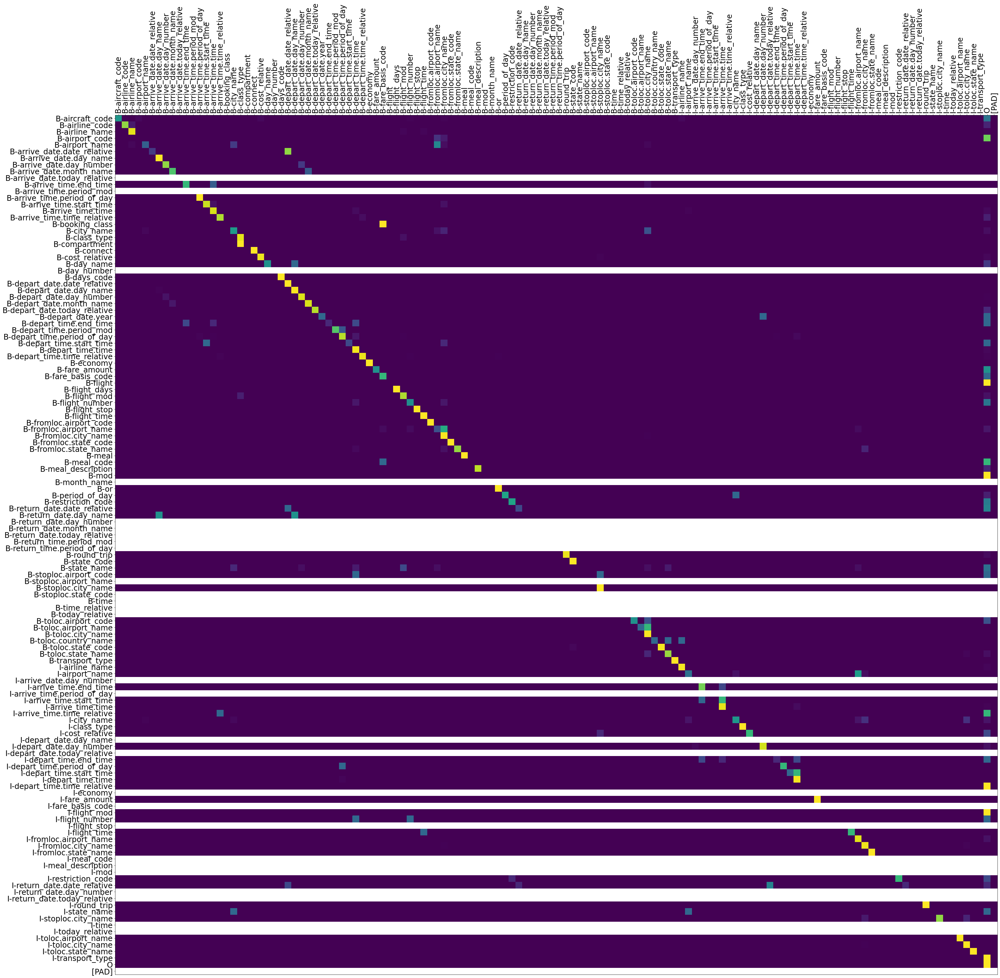

In [64]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

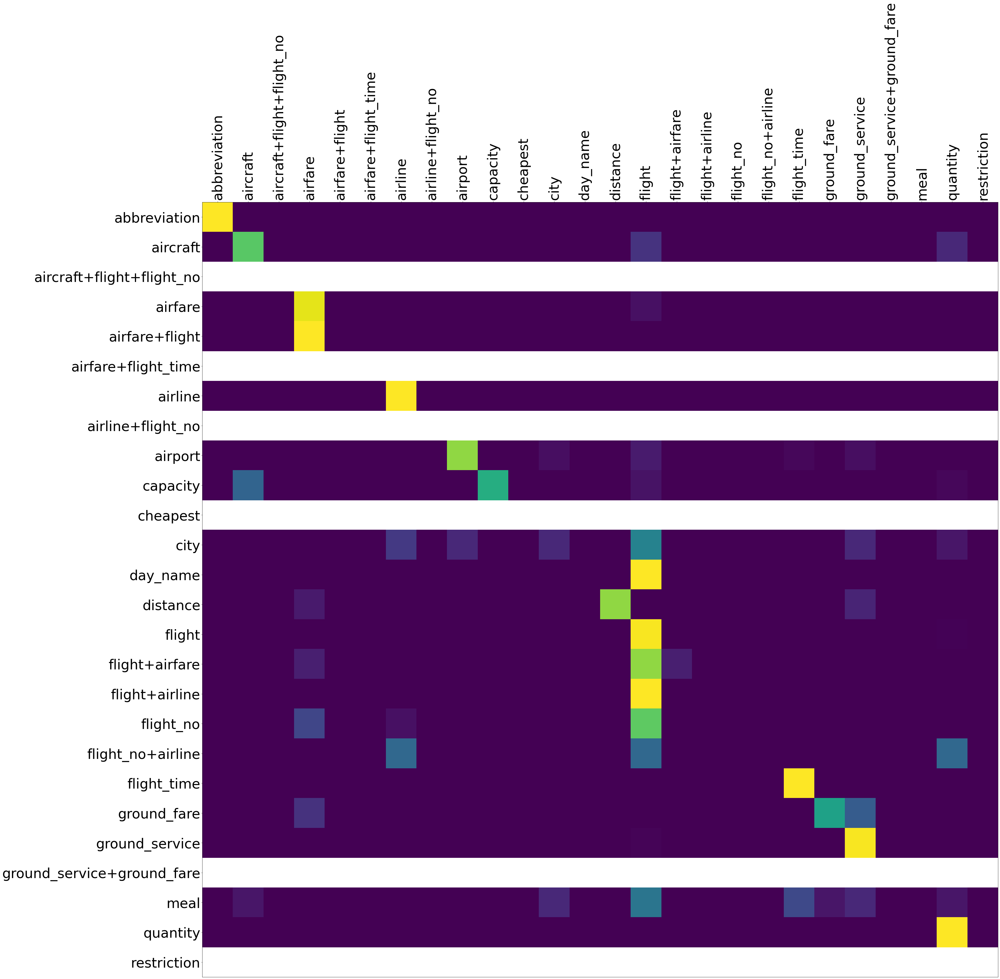

In [66]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=48,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=48,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_ATIS')

In [51]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_ATIS)

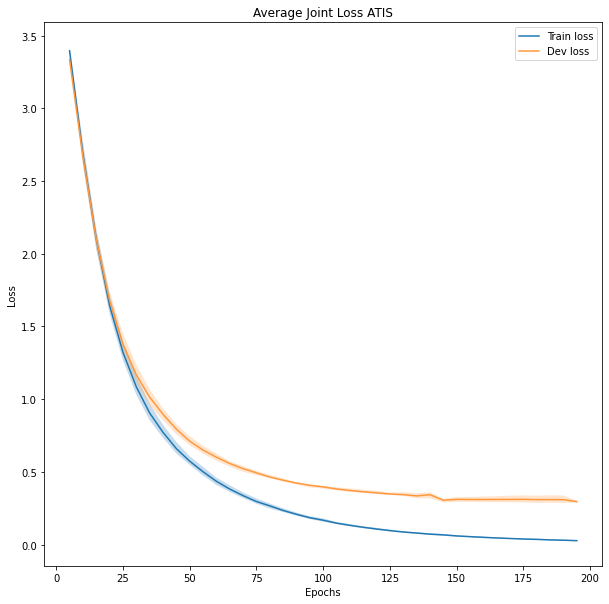

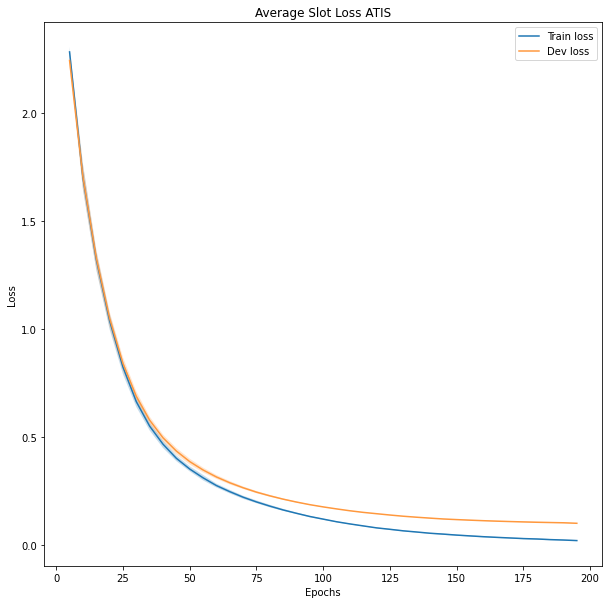

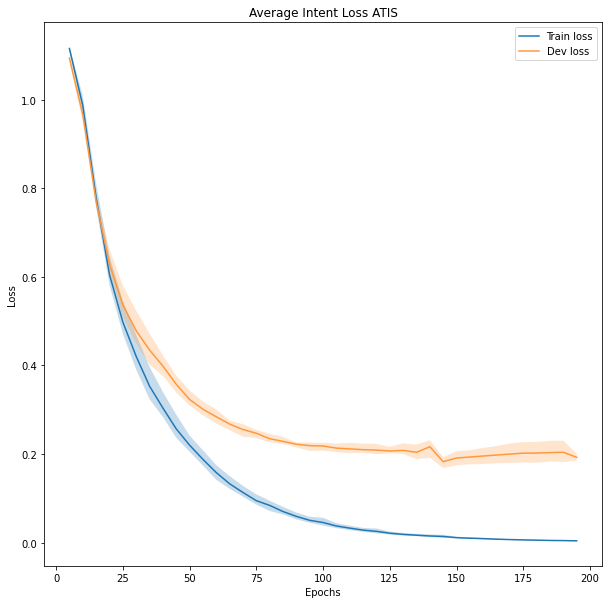

In [52]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [53]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_ATIS)

In [54]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [55]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [56]:
pprint(len(test_slot_errors))

193


In [57]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [58]:
pprint(len(test_intent_errors))

67


#### Remix ATIS

Here is tried a new divison of ATIS, but more balanced, in order to avoid the case of having labels that are present in the test set but not in the train or dev sets.

Train multiple times on remix ATIS

In [67]:
models, slot_test_remix_ATIS,intent_test_remix_ATIS,losses_train_remix_ATIS,losses_dev_remix_ATIS, slot_matrix_remix_ATIS, intent_matrix_remix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_remix_ATIS,dev_loader_remix_ATIS,test_loader_remix_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 87%|████████▋ | 174/199 [02:39<00:22,  1.09it/s]


#####Results

In [68]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [69]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
fromloc.state_name,1.000,1.000,1.00,8.0
depart_date.year,1.000,1.000,1.00,2.0
days_code,1.000,1.000,1.00,1.0
state_name,1.000,1.000,1.00,1.0
day_name,1.000,1.000,1.00,1.0
...,...,...,...,...
return_date.date_relative,0.222,0.167,0.19,4.0
meal_code,0.333,0.000,0.00,1.0
arrive_time.period_mod,1.000,0.000,0.00,1.0
return_date.day_number,1.000,0.000,0.00,1.0


Display results on intent classification task

In [70]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
distance,1.000,1.000,1.000,4.0
flight,0.979,0.992,0.986,655.0
ground_service,0.978,0.992,0.985,44.0
capacity,0.952,1.000,0.974,6.0
abbreviation,0.942,1.000,0.970,27.0
weighted avg,0.965,0.968,0.965,893.0
airfare,0.946,0.954,0.949,72.0
airline,0.953,0.889,0.920,30.0
quantity,1.000,0.792,0.883,8.0
aircraft,0.867,0.881,0.872,14.0


In [71]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9678984695782008


In [72]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.943629637 +- 0.00139017
Intent Acc 0.96789847 +- 0.00369522


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

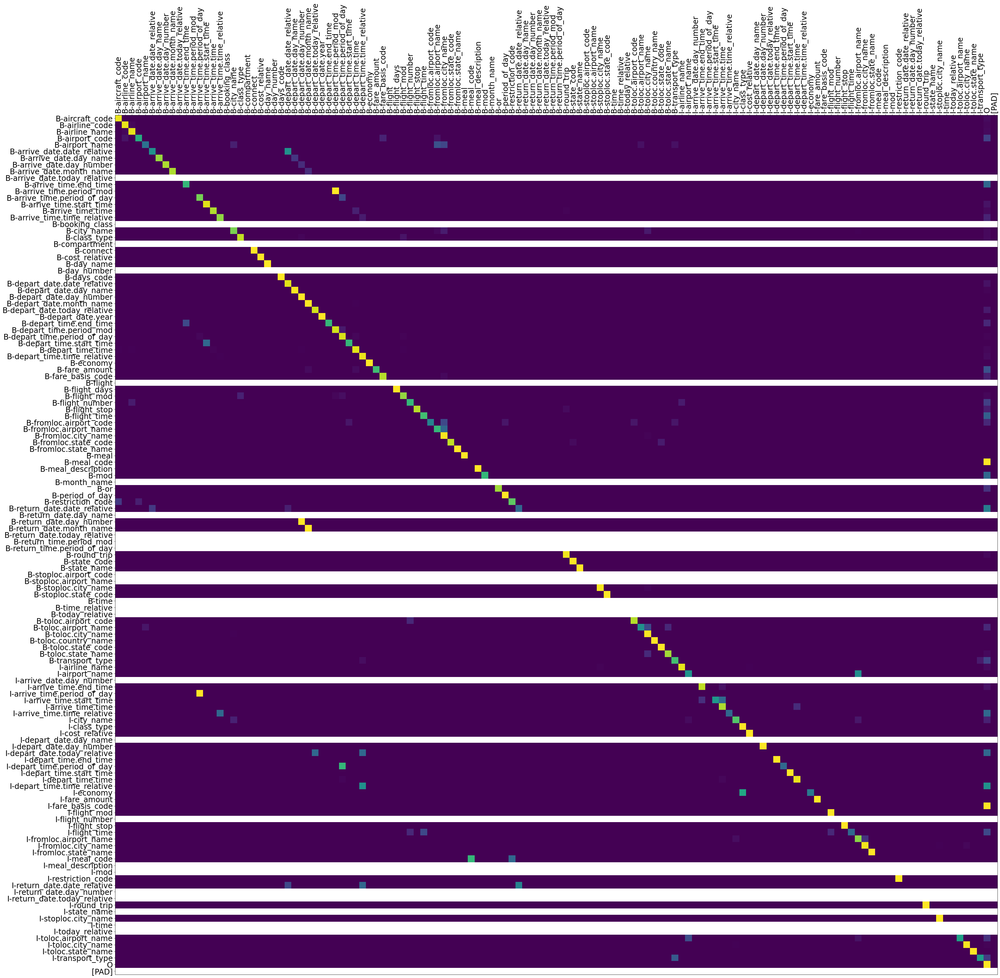

In [73]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

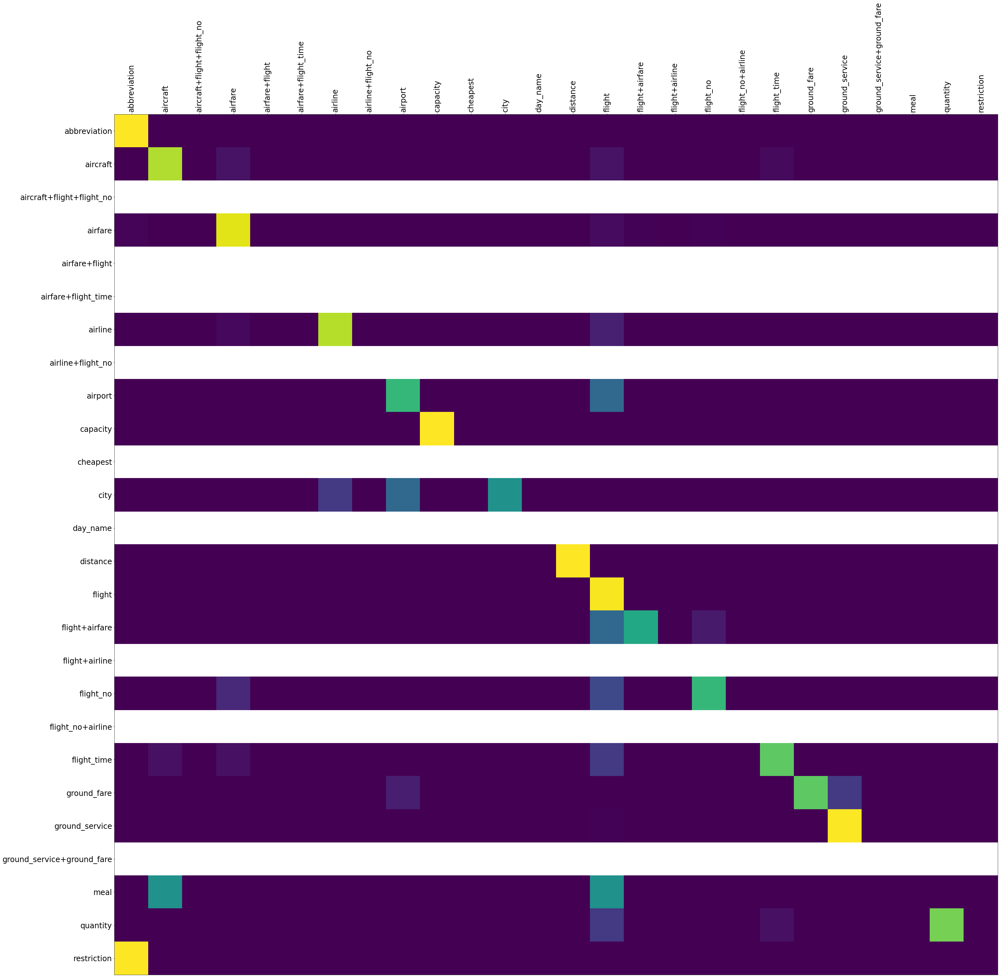

In [74]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_remix_ATIS')

In [75]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

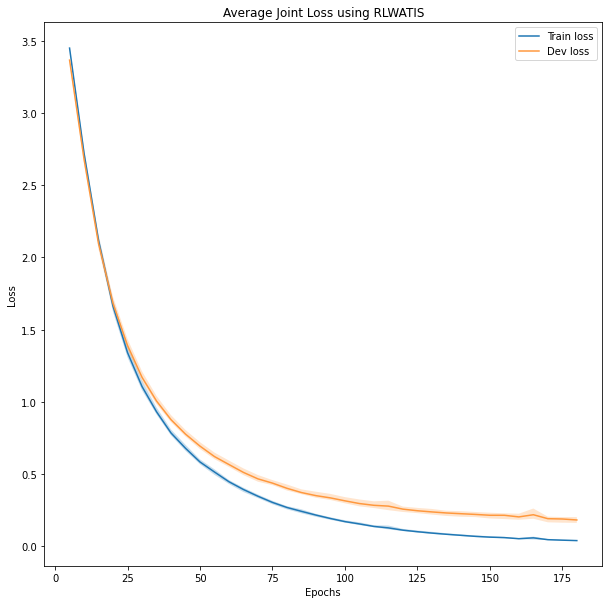

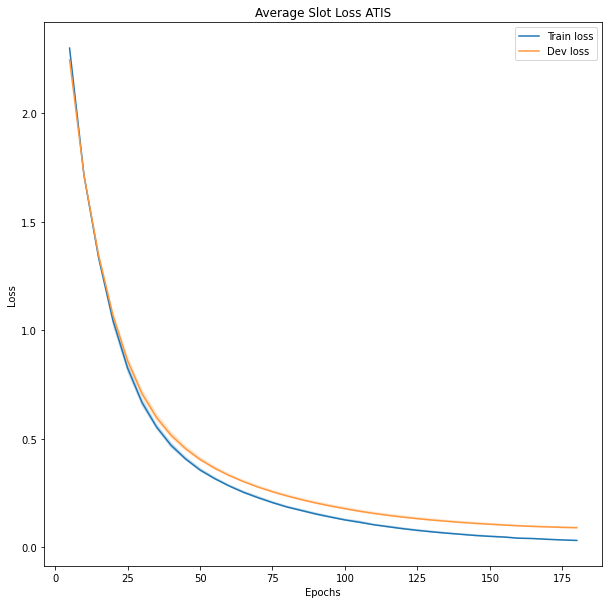

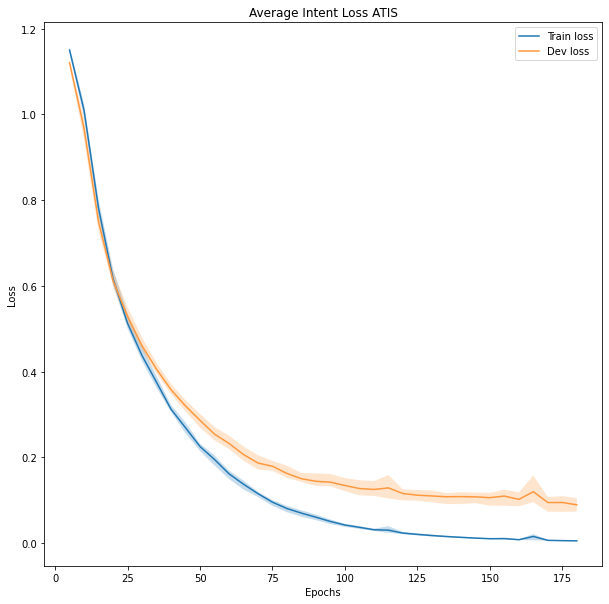

In [76]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss using RLWATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [77]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_remix_ATIS)

In [78]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [79]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O B-flight_stop O O B-fromloc.city_name O B-toloc.city_name '
              'O O B-arrive_time.start_time I-arrive_time.time O '
              'B-arrive_time.end_time I-arrive_time.end_time',
 'ref_slots': 'O O O B-flight_stop O O B-fromloc.city_name O B-toloc.city_name '
              'O O B-arrive_time.start_time I-arrive_time.start_time O '
              'B-arrive_time.end_time I-arrive_time.end_time',
 'utterance': 'i need a nonstop flight from atlanta to baltimore arriving '
              'between 5 pm and 730 pm'}


In [80]:
pprint(len(test_slot_errors))

120


In [81]:
pprint(test_intent_errors[0])

{'hyp_intent': 'aircraft',
 'ref_intent': 'meal',
 'utterance': 'what types of meals are available'}


In [82]:
pprint(len(test_intent_errors))

33


####SNIPS

Train multiple times on SNIPS

In [89]:
models, slot_test_SNIPS,intent_test_SNIPS,losses_train_SNIPS,losses_dev_SNIPS, slot_matrix_SNIPS, intent_matrix_SNIPS, = train_multiple(runs,lang_SNIPS,n_epochs,train_loader_SNIPS,dev_loader_SNIPS,test_loader_SNIPS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 65%|██████▍   | 129/199 [03:53<02:06,  1.81s/it]


#####Results

In [90]:
##average the results over multiple runs
slot_test_SNIPS_mean = result_mean(slot_test_SNIPS)
intent_test_SNIPS_mean = result_mean(intent_test_SNIPS)

Display results on slot filling task

In [91]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_SNIPS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
movie_type,1.000,1.000,1.000,33.0
best_rating,1.000,1.000,1.000,43.0
facility,1.000,1.000,1.000,3.0
rating_unit,1.000,1.000,1.000,40.0
service,0.973,1.000,0.986,24.0
year,0.987,0.986,0.986,24.0
rating_value,0.983,0.983,0.983,80.0
current_location,1.000,0.952,0.975,14.0
music_item,0.954,0.997,0.975,104.0
condition_temperature,0.986,0.957,0.971,23.0


Display results on intent classification task

In [92]:
intent_test_SNIPS_mean_no_acc = deepcopy(intent_test_SNIPS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_SNIPS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_SNIPS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
RateBook,0.996,0.979,0.987,80.0
BookRestaurant,0.975,0.986,0.980,92.0
GetWeather,0.963,0.987,0.975,104.0
AddToPlaylist,0.971,0.976,0.973,124.0
macro avg,0.953,0.954,0.952,700.0
weighted avg,0.953,0.952,0.952,700.0
SearchScreeningEvent,0.961,0.903,0.931,107.0
PlayMusic,0.885,0.977,0.928,86.0
SearchCreativeWork,0.918,0.869,0.893,107.0


In [93]:
pprint(intent_test_SNIPS_mean['accuracy'])

0.9519047619047619


In [94]:
slot_f1s_SNIPS = np.asarray([f['total']['f'] for f in slot_test_SNIPS])
intent_acc_SNIPS = np.asarray([f['accuracy'] for f in intent_test_SNIPS])
print('Slot F1', round(slot_f1s_SNIPS.mean(),9), '+-', round(slot_f1s_SNIPS.std(),9))
print('Intent Acc', round(intent_acc_SNIPS.mean(), 9), '+-', round(intent_acc_SNIPS.std(), 9))

Slot F1 0.803644803 +- 0.008001119
Intent Acc 0.951904762 +- 0.003367175


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

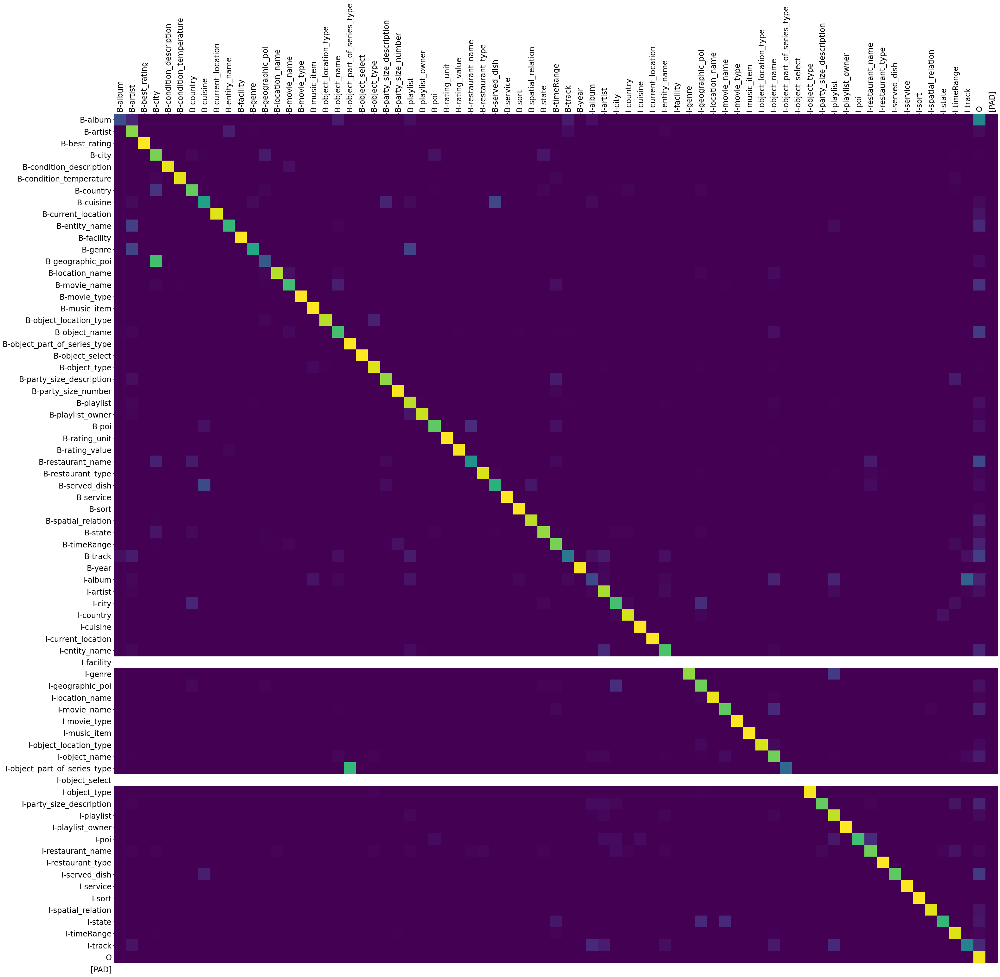

In [95]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_SNIPS')

<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

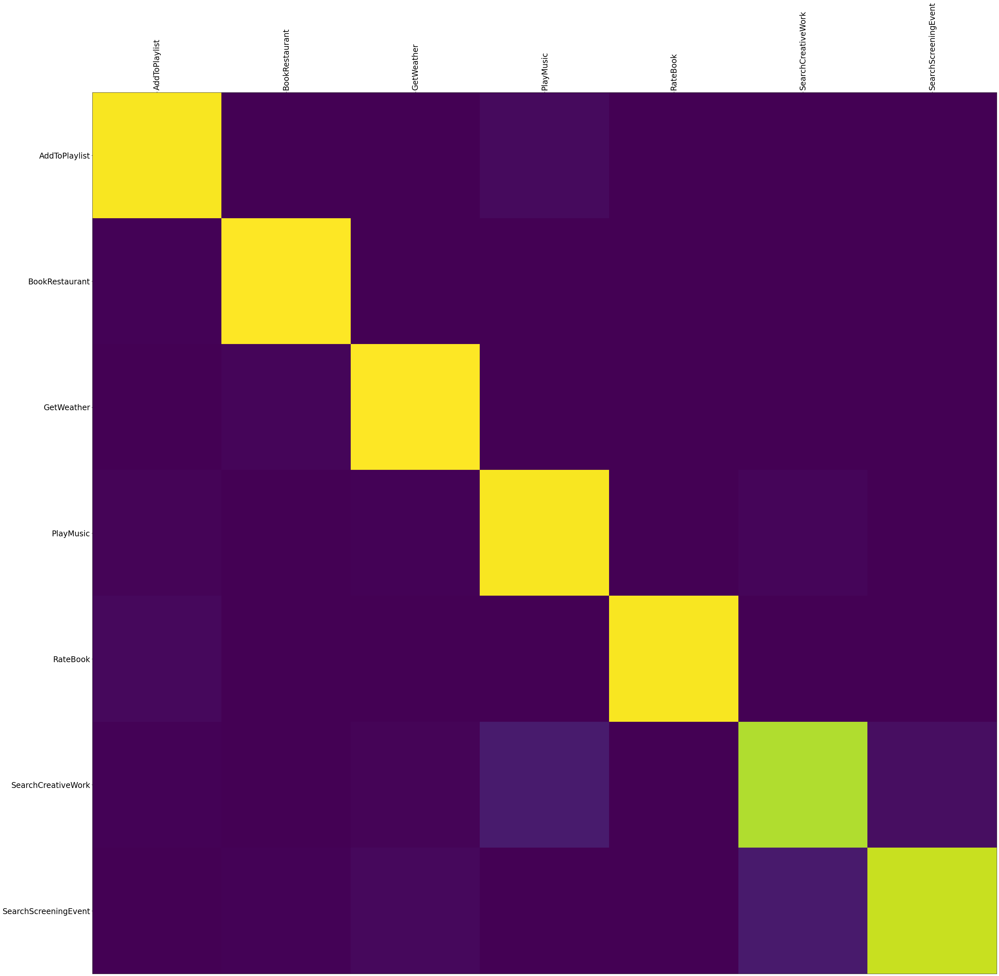

In [96]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_SNIPS')

In [97]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_SNIPS = numpy_fillna(losses_train_SNIPS)
losses_dev_SNIPS = numpy_fillna(losses_dev_SNIPS)

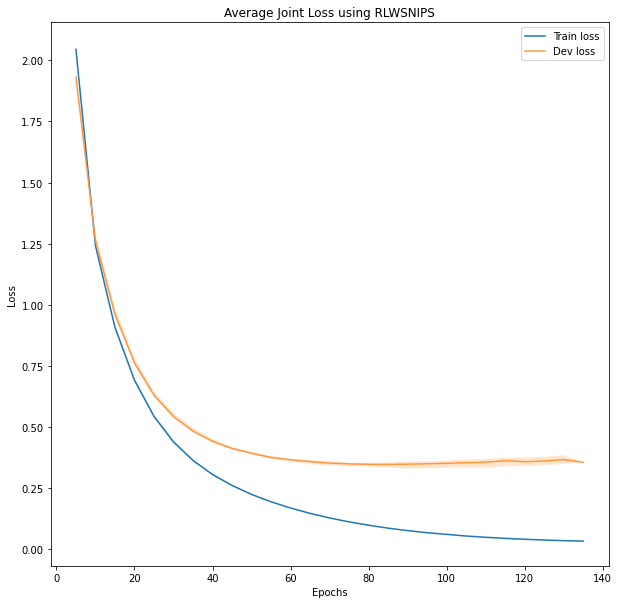

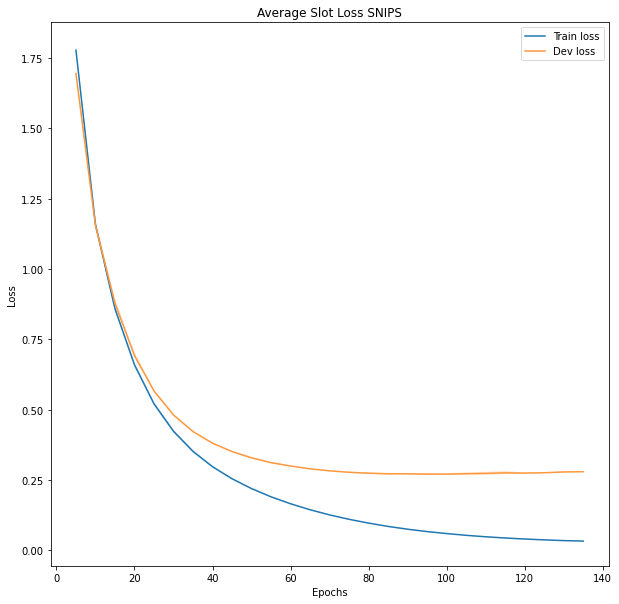

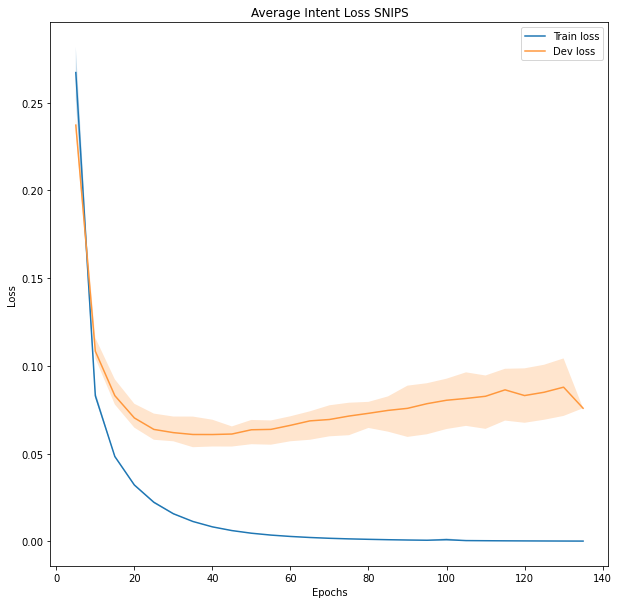

In [98]:
plot_loss(losses_train_SNIPS[:,:,0],losses_dev_SNIPS[:,:,0],sample_rate,'Average Joint Loss using RLWSNIPS')
plot_loss(losses_train_SNIPS[:,:,1],losses_dev_SNIPS[:,:,1],sample_rate,'Average Slot Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,2],losses_dev_SNIPS[:,:,2],sample_rate,'Average Intent Loss SNIPS') 

##### Errors

Check what errors the model makes

In [99]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_SNIPS,test_loader_SNIPS)

In [100]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [101]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O O O O O O B-city I-city B-country I-geographic_poi '
              'I-geographic_poi I-geographic_poi O B-timeRange I-timeRange '
              'I-timeRange I-timeRange',
 'ref_slots': 'O O O O O O O O O B-geographic_poi I-geographic_poi '
              'I-geographic_poi I-geographic_poi I-geographic_poi '
              'I-geographic_poi O B-timeRange I-timeRange I-timeRange '
              'I-timeRange',
 'utterance': 'what is the weather going to be like in [UNK] gold rush '
              'national historical park on february the 28th 2034'}


In [102]:
pprint(len(test_slot_errors))

251


In [103]:
pprint(test_intent_errors[0])

{'hyp_intent': 'GetWeather',
 'ref_intent': 'BookRestaurant',
 'utterance': 'on june 27 2026 i d like to go to a delaware gastropub'}


In [104]:
pprint(len(test_intent_errors))

32


#Proposal 1: biLSTM + Pseudo Randomly Weighted Loss + Focal Loss

A slighlty improved LSTM over the baseline model:

- bidirectional LSTM
- increased size of embedding
- increased size of hidden
- increased number of layers for the LSTM
- layer normalization
- dropout
- better early stopping criteria, on both losses instead of slot filling f1 score
- increase number of epochs ( which is not a problem due to early stopping )

Plus:

- Randomly Weighted Loss
- Focal Loss

However it uses a pseudo randomly weighting, with the higher weight applied to the higher loss. This should help improve the results, as higher losses will be weighted more and therefore the model should learn better


BiLSTM.svg

In [105]:
class ModelBiLSTM(nn.Module):

  def __init__(self, hid_size, out_slot, out_int, emb_size, vocab_len, n_layer=1, pad_index=0):
      super(ModelBiLSTM, self).__init__()
      ##emb_size = word embedding size
      ##hid_size = hidden size
      ##out_slot = output size for slot filling
      ##out_int = ouput size for intent class
      self.embedding = nn.Embedding(vocab_len, emb_size, padding_idx=pad_index)
      self.utt_encoder = nn.LSTM(emb_size, hid_size, n_layer, bidirectional=True)
      ##layer normalization
      self.layer_norm_slot = nn.LayerNorm(hid_size*2)
      ##layer normalization
      self.layer_norm_intent = nn.LayerNorm(hid_size)
      ##apply dropout before last layers
      self.dropout = nn.Dropout(0.1) 
      ##twice because it is a biLSTM, and i use the utt_encoded
      self.slot_out = nn.Linear(hid_size*2, out_slot)
      ##only once because i use only last hidden layer
      self.intent_out = nn.Linear(hid_size, out_int)
      self.leaky_relu = nn.LeakyReLU()
  def forward(self, utterance, seq_lengths):
      utt_emb = self.embedding(utterance)
      utt_emb = utt_emb.permute(1,0,2) 
      ##pack_padded_sequence avoid computation over pad tokens reducing the computational cost
      packed_input = pack_padded_sequence(utt_emb, seq_lengths.cpu().numpy())
      ##Process the batch
      packed_output, (last_hidden, cell) = self.utt_encoder(packed_input) 
      ##Unpack the sequence
      utt_encoded, input_sizes = pad_packed_sequence(packed_output)
      ##Get the last hidden state
      last_hidden = last_hidden[-1,:,:]
      ##Compute slot filling with dropout

      slots = self.layer_norm_slot(utt_encoded)
      slots = self.dropout(slots)
      slots = self.slot_out(slots)
    #   slots = self.leaky_relu(slots)
      slots = slots.permute(1,2,0)

      ##Compute intent classification with dropout
      intent = self.layer_norm_intent(last_hidden)
      intent = self.dropout(intent)
      intent = self.intent_out(intent)
    #   intent = self.leaky_relu(intent)
      return slots, intent

###Train Loop and Evaluation Loop
Two functions `train_loop()` and `evaluate_loop()` one for training the model and the other for evaluating it.

To compute the performances on the slot filling task it will used the evaluate function from the **conll script**, while for the intent classification **classification_report** from scikitlearn. 

In [106]:
def train_loop(data, optimizer, criterion_slots, criterion_intents,clip, model):
    '''
    function to train the model

    input
    - data : dataset
    - optimizer : optimizer 
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - model : model to be trained

    output
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    '''
    model.train()
    loss_array = []

    for sample in data:
        optimizer.zero_grad() ##Zeroing the gradient
        slots, intent = model(sample['utterances'], sample['slots_len'])
        loss_intent = criterion_intents(intent, sample['intents'])
        loss_slot = criterion_slots(slots, sample['y_slots'])
        weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
        torch.sort(weight)
        if loss_slot<loss_intent:
            loss = weight[0]*loss_slot+ weight[1]*loss_intent
        else: 
            loss = weight[0]*loss_intent+ weight[1]*loss_slot
        loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
        loss.backward() ##Compute the gradient
        ##clip the gradient to avoid explosioning gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)  
        optimizer.step() ##Update the weights
    return np.asarray(loss_array)

def eval_loop(data, criterion_slots, criterion_intents, model, lang):
    '''
    function to evaluate the model
    
    input
    - data : dataset
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - model : model to be trained
    - lang : language class Lang used for the dataset

    output
    - results_slot : evaluation of slot filling using conll evaluate,
    - report_intent: evaluation of intent classification using scikitlearn classification report,
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    - matrix_slot: confusion matrix on slot filling
    - matrix_intent confusion matrix on intent classification
    '''
    model.eval()
    loss_array = []
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    #softmax = nn.Softmax(dim=1) ##Use Softmax if you need the actual probability
    with torch.no_grad(): ##It used to avoid the creation of computational graph
        for sample in data:
            slots, intents = model(sample['utterances'], sample['slots_len'])
            loss_intent = criterion_intents(intents, sample['intents'])
            loss_slot = criterion_slots(slots, sample['y_slots'])
            weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
            torch.sort(weight)
            if loss_slot<loss_intent:
                loss = weight[0]*loss_slot+ weight[1]*loss_intent
            else: 
                loss = weight[0]*loss_intent+ weight[1]*loss_slot
            loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
            
            ##Intent inference
            out_intents = [lang.id2intent[x] 
                           for x in torch.argmax(intents, dim=1).tolist()] 
            gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
            ref_intents.extend(gt_intents)
            hyp_intents.extend(out_intents)
            
            ##Slot inference 
            output_slots = torch.argmax(slots, dim=1)
            for id_seq, seq in enumerate(output_slots):
                length = sample['slots_len'].tolist()[id_seq]
                utt_ids = sample['utterance'][id_seq][:length].tolist()
                gt_ids = sample['y_slots'][id_seq].tolist()
                gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
                utterance = [lang.id2word[elem] for elem in utt_ids]
                to_decode = seq[:length].tolist()
                ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
                tmp_seq = []
                for id_el, elem in enumerate(to_decode):
                    ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                    tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
                hyp_slots.append(tmp_seq)
    try:            
        results_slot = evaluate(ref_slots, hyp_slots)
    except Exception as ex:
        ##Sometimes the model predics a class that is not in REF
        print(ex)
        ref_s = set([x[1] for x in ref_slots])
        hyp_s = set([x[1] for x in hyp_slots])
        print(hyp_s.difference(ref_s))
        
    report_intent = classification_report(ref_intents, hyp_intents, 
                                          zero_division=False, output_dict=True)
    
    matrix_slot = confusion_matrix([token[1] for sent in ref_slots for token in sent], [token[1] for sent in hyp_slots for token in sent],labels=list(lang.slot2id.keys()))
    matrix_intent = confusion_matrix(ref_intents, hyp_intents,labels=list(lang.intent2id.keys()))
    
    return results_slot, report_intent, np.asarray(loss_array), matrix_slot, matrix_intent


In [107]:
def train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to train a model using patience as early stopping.
    input
    - model : model to be trained
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - losses_train : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    '''
    ##list of recorded losses
    losses_train = []
    losses_dev = []
    ##list of epochs that were sampled for validation
    sampled_epochs = []
    ##early stopping on joint loss
    best_loss_slot,best_loss_intent = float('inf'),float('inf')
    ##patience
    patience_intent,patience_slot = patience,patience
    for x in tqdm(range(1,n_epochs)):
        ##train
        loss = train_loop(train_loader, optimizer, criterion_slots, criterion_intents,clip, model)
        ##every sample rate
        if x % sample_rate == 0:
            ##record epoch
            sampled_epochs.append(x)
            ##record losses on train ( 3 loss array)
            losses_train.append(loss.mean(axis=0))
            ##record losses on dev (3 loss array )
            slot_dev, intent_dev, loss_dev,_,_ = eval_loop(dev_loader, criterion_slots, criterion_intents, model, lang)
            losses_dev.append(loss_dev.mean(axis=0))
            ##early stopping considering mean joint loss on dev set
            if loss_dev.mean(axis=0)[1] < best_loss_slot:
                best_loss_slot = loss_dev.mean(axis=0)[1]
            else:
                patience_slot -= 1
            if loss_dev.mean(axis=0)[2] < best_loss_intent:
                best_loss_intent = loss_dev.mean(axis=0)[2]
            else:
                patience_intent -= 1
            if patience_slot <= 0 and patience_intent <=0:
                break 
    return losses_train,losses_dev

In [108]:
def train_multiple(runs,lang,n_epochs,train_loader,dev_loader,test_loader,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to a model using patience as early stopping multiple times
    input
    - runs: number of runs
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - test_loader : test set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - models : list of models trained
    - results_slots : a list of evaluation of slot filling using conll evaluate of length runs,
    - reports_intents: a list of evaluation of intent classification using scikitlearn classification report of length runs,
    - losses_train_mul : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev_mul : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - matrix_slot: a list of confusion matrixes on slot filling of length runs
    - matrix_intent: a list confusion matrixes on intent classification of length runs
    '''
    out_slot = len(lang.slot2id)
    out_int = len(lang.intent2id)
    vocab_len = len(lang.word2id)
    ##list of test results
    results_slots, results_intents = [],[]
    ##list of losses through the run
    losses_train_mul = []
    losses_dev_mul = []
    ##models
    models = []
    slot_matrix = np.zeros((runs,out_slot,out_slot))
    intent_matrix = np.zeros((runs,out_int,out_int))
    for x in range(0, runs):
        model = ModelBiLSTM(hid_size, out_slot, out_int, emb_size, vocab_len,n_layer=n_layer, pad_index=PAD_TOKEN).to(device)
        model.apply(init_weights)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        ##train
        losses_train,losses_dev = train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate)
        losses_train_mul.append(losses_train)
        losses_dev_mul.append(losses_dev)
        ##test results
        slot_test, intent_test, loss_test, slot_m, intent_m = eval_loop(test_loader, criterion_slots, criterion_intents, model, lang)
        slot_matrix[x] += slot_m
        intent_matrix[x] += intent_m
        results_slots.append(slot_test)
        results_intents.append(intent_test)
        models.append(model)
    return models,results_slots,results_intents,losses_train_mul,losses_dev_mul,slot_matrix,intent_matrix

In [109]:
# error function to test the model and sample the predictions used for error
def eval_loop_complete(model, lang, data):
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    for sample in data:
        ##Intent inference
        slots,intents = model.forward(sample['utterances'],sample['slots_len'])

        out_intents = [lang.id2intent[x] 
                        for x in torch.argmax(intents, dim=1).tolist()] 
        gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
        ref_intents.extend(gt_intents)
        hyp_intents.extend(out_intents)

        ##Slot inference 
        output_slots = torch.argmax(slots, dim=1)
        for id_seq, seq in enumerate(output_slots):
            length = sample['slots_len'].tolist()[id_seq]
            # i need ignore the [CLS] and [SEP] tokens!
            utt_ids = sample['utterance'][id_seq][:length].tolist()
            gt_ids = sample['y_slots'][id_seq].tolist()
            gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
            utterance = [lang.id2word[elem] for elem in utt_ids]
            to_decode = seq[:length].tolist()
            ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
            tmp_seq = []
            for id_el, elem in enumerate(to_decode):
                ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
            hyp_slots.append(tmp_seq)
    return ref_slots,hyp_slots,ref_intents,hyp_intents,
                

###Training

To have reliable results on small corpora train and test the model will be done several times over. At the end, the results are averaged.

In [110]:
##parameters for training
hid_size = 300
emb_size = 400
n_layer = 4
lr = 0.0001 ##learning rate
clip = 5 ##Clip the gradient
runs = 3 ##runs
n_epochs = 200 ##epochs for each run
patience_max = 5 ##patience for early stopping for each run. Computed every sample_rate steps
sample_rate = 5
criterion_slots = FocalLoss(gamma=2,reduction='sum',ignore_index=PAD_TOKEN)
criterion_intents =  FocalLoss(gamma=2,reduction='sum')

####ATIS

Train multiple times on ATIS

In [111]:
models, slot_test_ATIS,intent_test_ATIS,losses_train_ATIS,losses_dev_ATIS, slot_matrix_ATIS, intent_matrix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_ATIS,dev_loader_ATIS,test_loader_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 37%|███▋      | 74/199 [03:43<06:17,  3.02s/it]


#####Results

In [112]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_ATIS)

Display results on slot filling task

In [113]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
depart_time.start_time,1.0,1.0,1.0,3.0
days_code,1.0,1.0,1.0,1.0
flight_stop,1.0,1.0,1.0,21.0
economy,1.0,1.0,1.0,6.0
arrive_date.date_relative,1.0,1.0,1.0,2.0
...,...,...,...,...
toloc.country_name,1.0,0.0,0.0,1.0
stoploc.airport_code,1.0,0.0,0.0,1.0
return_date.day_name,1.0,0.0,0.0,2.0
flight,1.0,0.0,0.0,1.0


Display results on intent classification task

In [114]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
flight_time,1.000,1.000,1.000,1.0
airline,0.983,0.991,0.987,38.0
ground_service,0.973,1.000,0.986,36.0
abbreviation,0.971,1.000,0.985,33.0
flight,0.954,0.992,0.973,632.0
capacity,1.000,0.937,0.967,21.0
airfare,0.940,0.972,0.956,48.0
weighted avg,0.945,0.953,0.944,893.0
airport,1.000,0.852,0.920,18.0
aircraft,0.933,0.889,0.908,9.0


In [115]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9529675251959686


In [116]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.946977022 +- 0.000878953
Intent Acc 0.952967525 +- 0.005995662


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

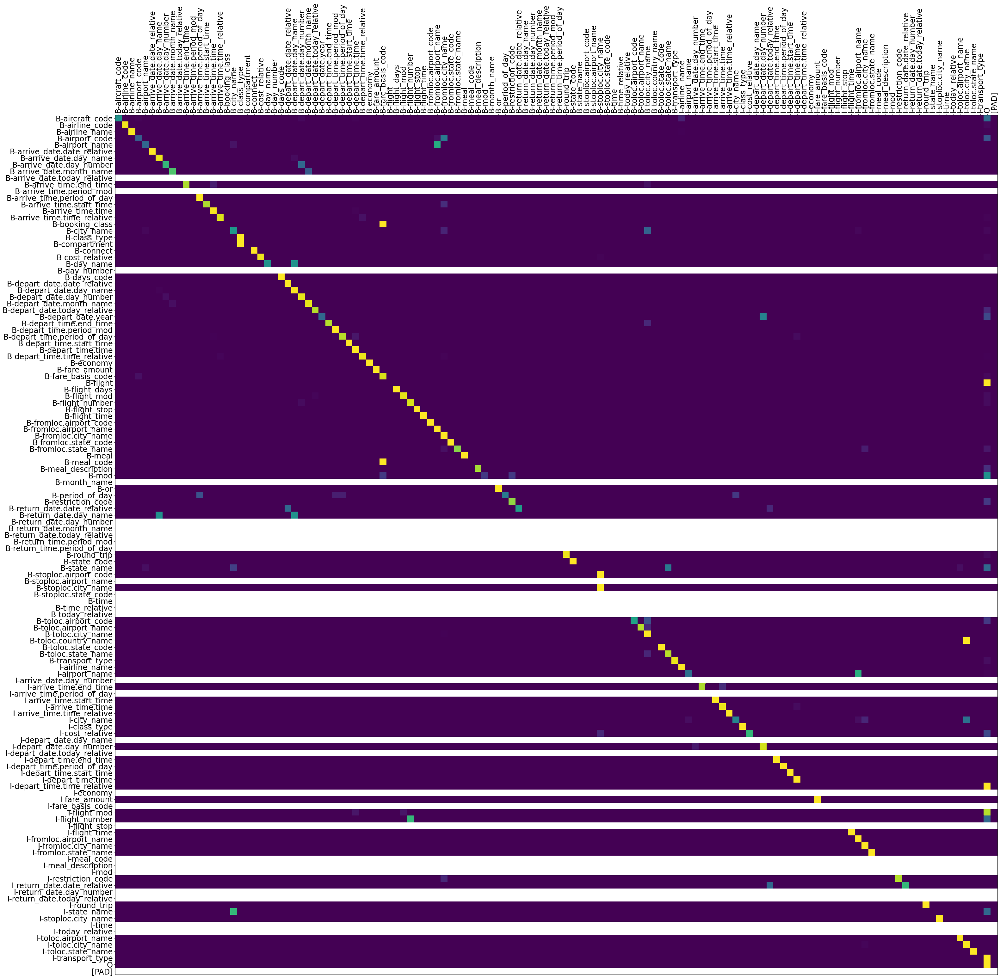

In [117]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

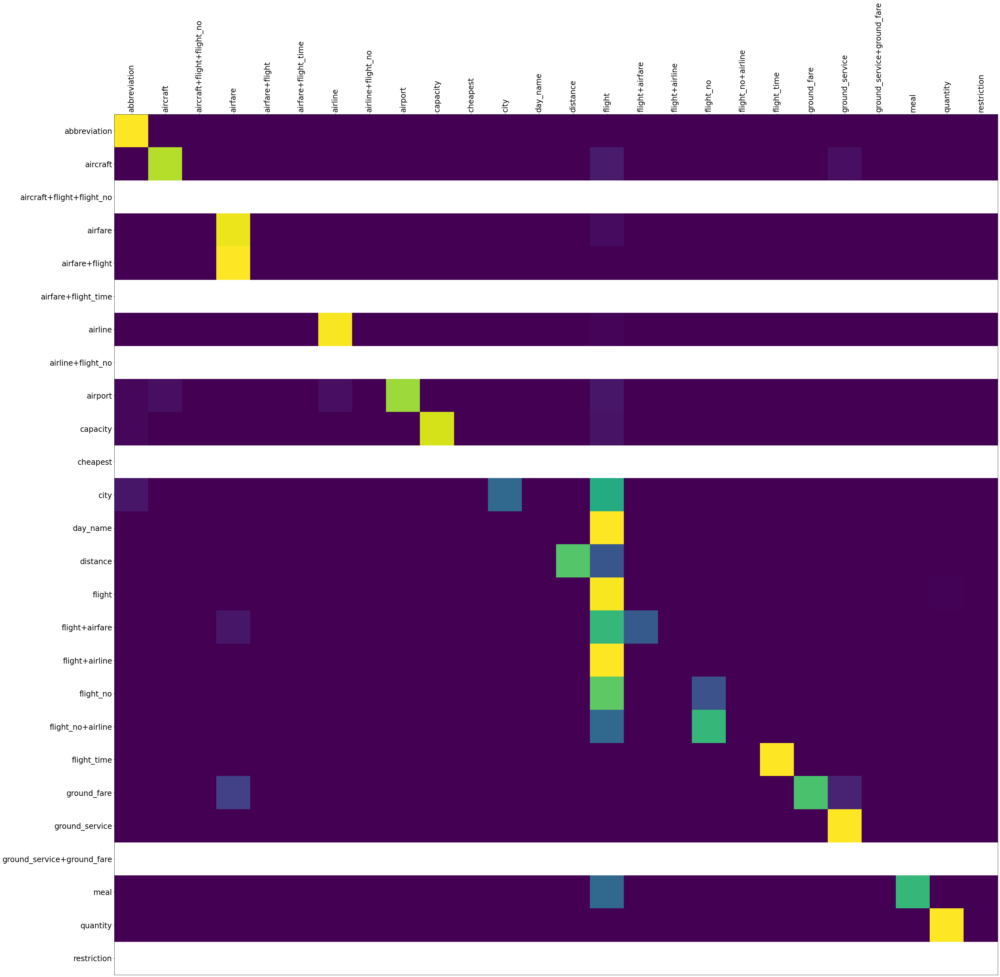

In [118]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_ATIS')

In [119]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_ATIS)

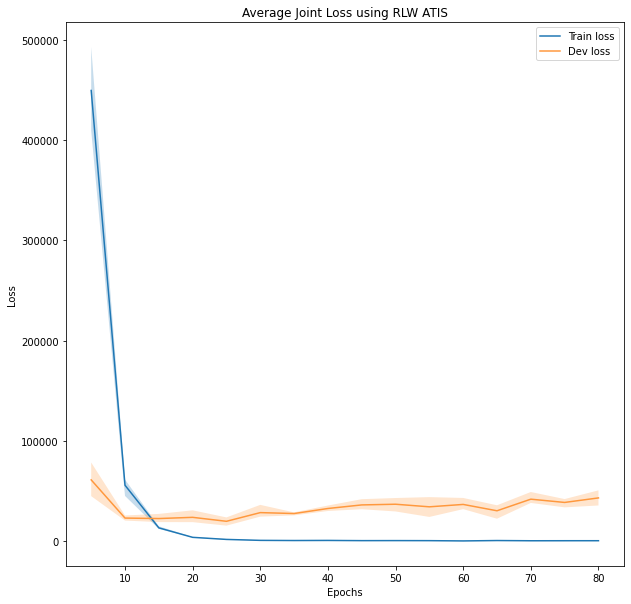

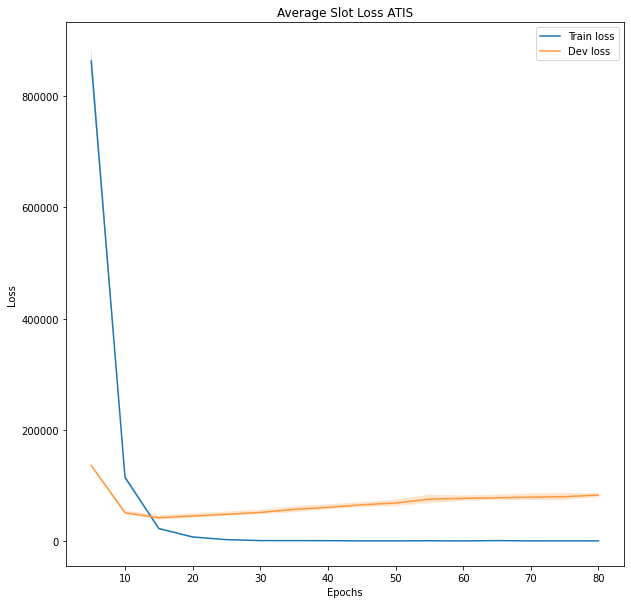

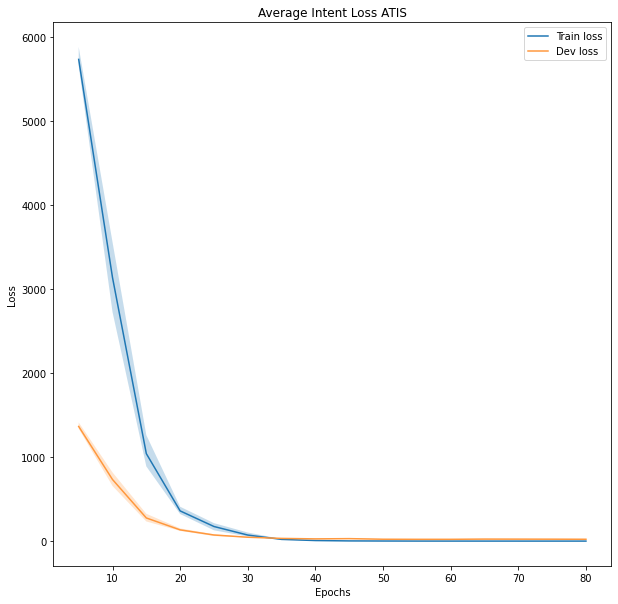

In [120]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss using RLW ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [121]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_ATIS)

In [122]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [123]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [124]:
pprint(len(test_slot_errors))

138


In [125]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [126]:
pprint(len(test_intent_errors))

43


#### Remix ATIS

Here is tried a new divison of ATIS, but more balanced, in order to avoid the case of having labels that are present in the test set but not in the train or dev sets.

Train multiple times on remix ATIS

In [127]:
models, slot_test_remix_ATIS,intent_test_remix_ATIS,losses_train_remix_ATIS,losses_dev_remix_ATIS, slot_matrix_remix_ATIS, intent_matrix_remix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_remix_ATIS,dev_loader_remix_ATIS,test_loader_remix_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 35%|███▍      | 69/199 [03:24<06:26,  2.97s/it]


#####Results

In [128]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [129]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
depart_date.year,1.000,1.000,1.000,2.0
depart_time.end_time,1.000,1.000,1.000,3.0
days_code,1.000,1.000,1.000,1.0
state_name,1.000,1.000,1.000,1.0
airline_code,1.000,1.000,1.000,19.0
...,...,...,...,...
return_date.date_relative,0.717,0.833,0.769,4.0
arrive_time.period_of_day,0.736,0.792,0.762,8.0
fromloc.airport_code,1.000,0.444,0.611,6.0
meal_code,0.000,0.000,0.000,1.0


Display results on intent classification task

In [130]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
capacity,1.000,1.000,1.000,6.0
distance,1.000,1.000,1.000,4.0
ground_service,1.000,0.977,0.989,44.0
flight,0.978,0.995,0.987,655.0
weighted avg,0.971,0.972,0.970,893.0
abbreviation,0.931,1.000,0.964,27.0
airfare,0.953,0.940,0.946,72.0
airline,1.000,0.889,0.941,30.0
quantity,1.000,0.875,0.933,8.0
flight_time,0.875,0.875,0.875,8.0


In [131]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9720044792833146


In [132]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.973328399 +- 0.000431735
Intent Acc 0.972004479 +- 0.001583666


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

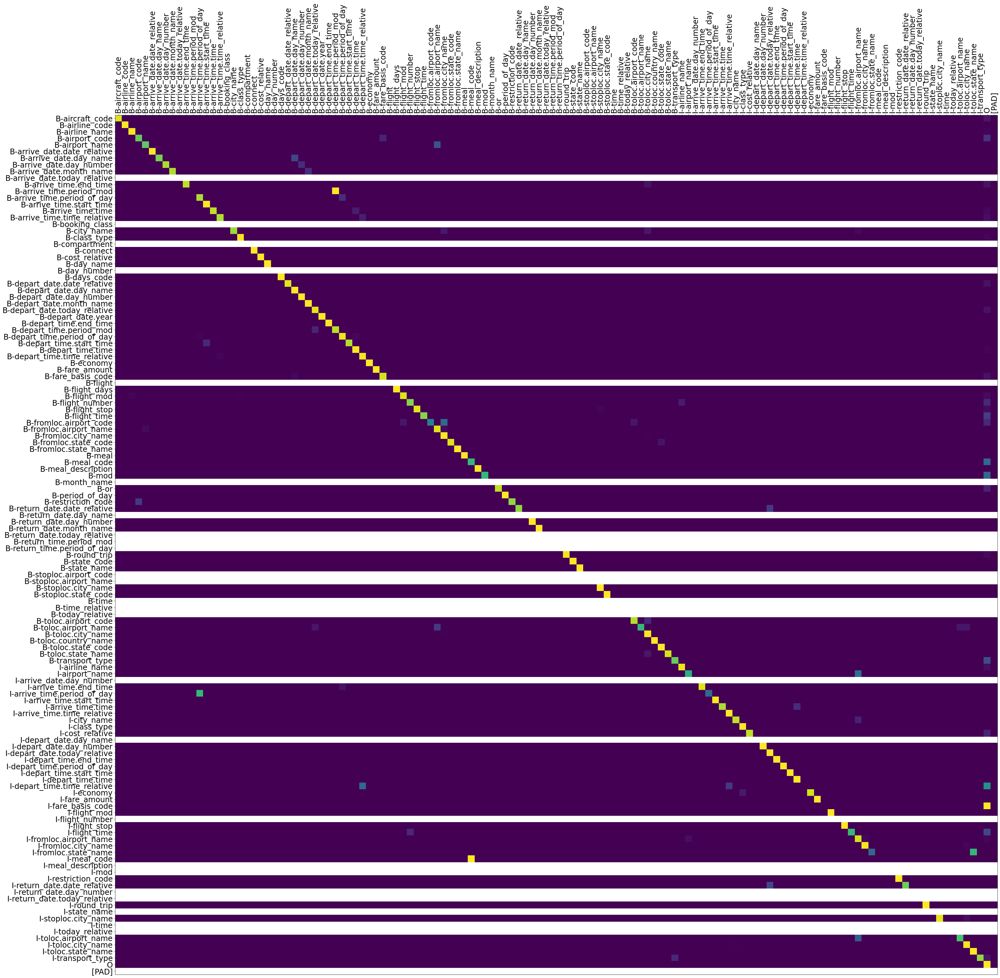

In [133]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

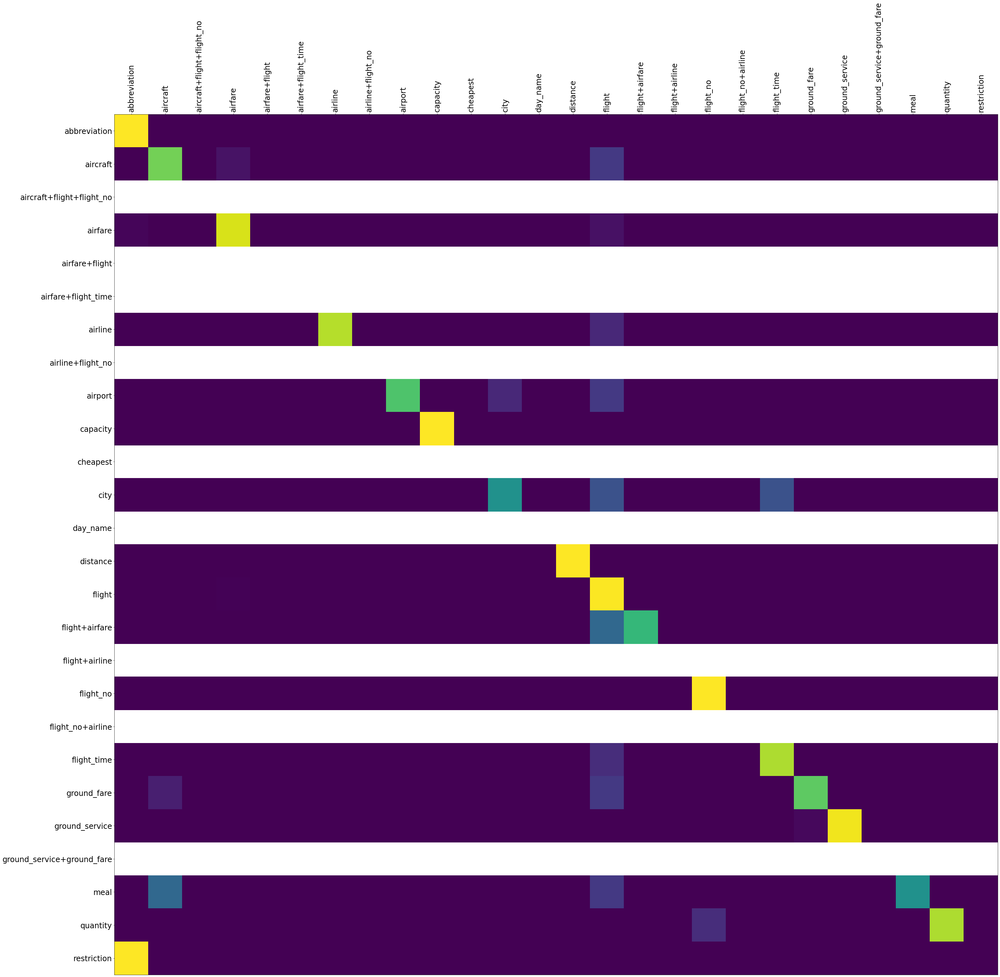

In [134]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_remix_ATIS')

In [135]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

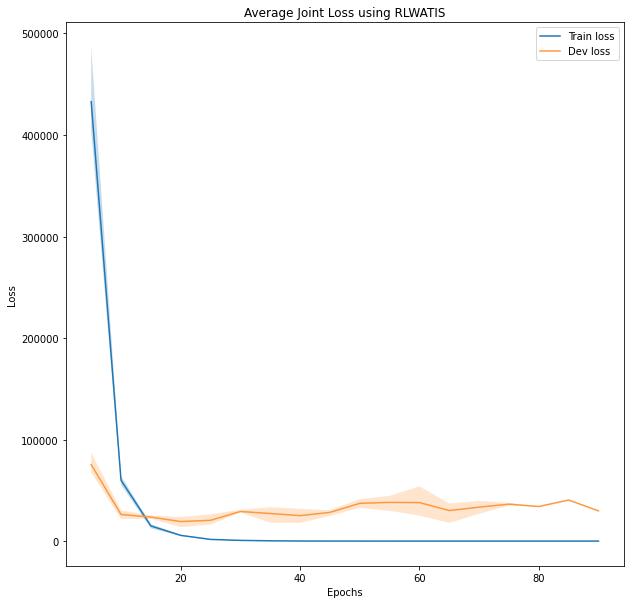

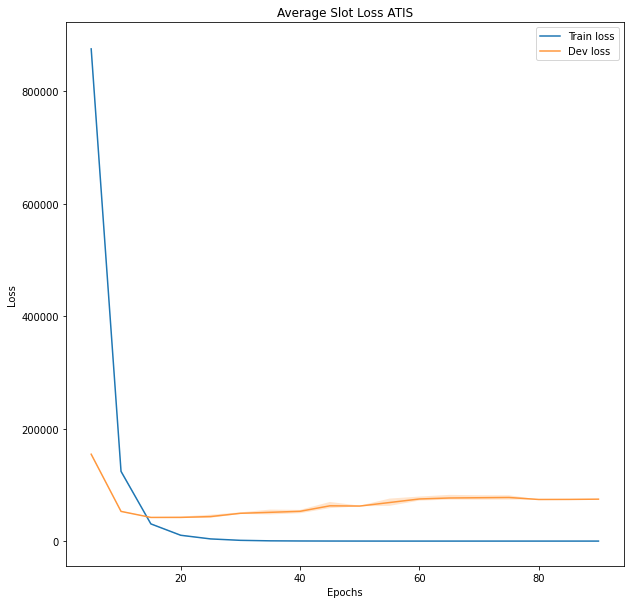

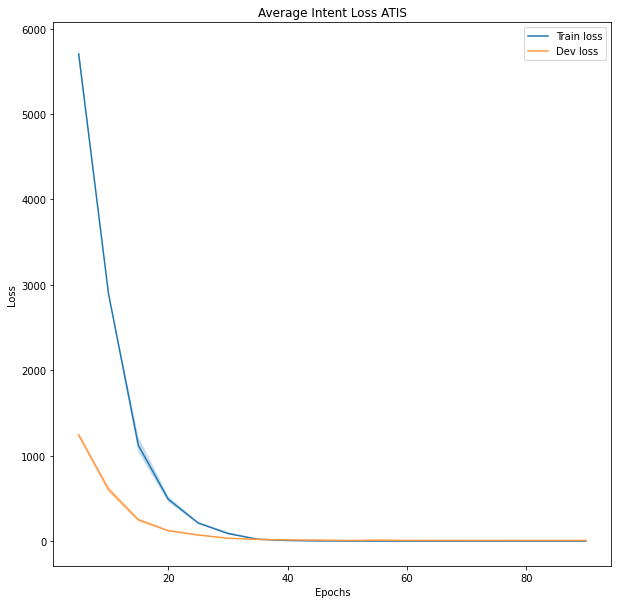

In [136]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss using RLWATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [137]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_ATIS)

In [138]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [139]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [140]:
pprint(len(test_slot_errors))

13


In [141]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [142]:
pprint(len(test_intent_errors))

5


####SNIPS

Train multiple times on SNIPS

In [143]:
models, slot_test_SNIPS,intent_test_SNIPS,losses_train_SNIPS,losses_dev_SNIPS, slot_matrix_SNIPS, intent_matrix_SNIPS, = train_multiple(runs,lang_SNIPS,n_epochs,train_loader_SNIPS,dev_loader_SNIPS,test_loader_SNIPS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 22%|██▏       | 44/199 [04:48<16:55,  6.55s/it]


#####Results

In [144]:
##average the results over multiple runs
slot_test_SNIPS_mean = result_mean(slot_test_SNIPS)
intent_test_SNIPS_mean = result_mean(intent_test_SNIPS)

Display results on slot filling task

In [145]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_SNIPS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
object_location_type,1.000,1.000,1.000,22.0
best_rating,1.000,1.000,1.000,43.0
rating_unit,1.000,1.000,1.000,40.0
rating_value,0.996,1.000,0.998,80.0
movie_type,0.990,1.000,0.995,33.0
party_size_number,0.980,1.000,0.990,50.0
current_location,1.000,0.976,0.988,14.0
playlist_owner,0.977,0.995,0.986,70.0
condition_temperature,0.972,1.000,0.986,23.0
restaurant_type,0.990,0.979,0.985,65.0


Display results on intent classification task

In [146]:
intent_test_SNIPS_mean_no_acc = deepcopy(intent_test_SNIPS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_SNIPS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_SNIPS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
BookRestaurant,0.989,0.993,0.991,92.0
RateBook,0.988,0.987,0.988,80.0
AddToPlaylist,0.981,0.992,0.987,124.0
GetWeather,0.984,0.981,0.982,104.0
macro avg,0.964,0.964,0.963,700.0
weighted avg,0.963,0.963,0.963,700.0
PlayMusic,0.936,0.965,0.950,86.0
SearchScreeningEvent,0.955,0.910,0.931,107.0
SearchCreativeWork,0.911,0.919,0.915,107.0


In [147]:
pprint(intent_test_SNIPS_mean['accuracy'])

0.9628571428571427


In [148]:
slot_f1s_SNIPS = np.asarray([f['total']['f'] for f in slot_test_SNIPS])
intent_acc_SNIPS = np.asarray([f['accuracy'] for f in intent_test_SNIPS])
print('Slot F1', round(slot_f1s_SNIPS.mean(),9), '+-', round(slot_f1s_SNIPS.std(),9))
print('Intent Acc', round(intent_acc_SNIPS.mean(), 9), '+-', round(intent_acc_SNIPS.std(), 9))

Slot F1 0.881044586 +- 0.002728785
Intent Acc 0.962857143 +- 0.002020305


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

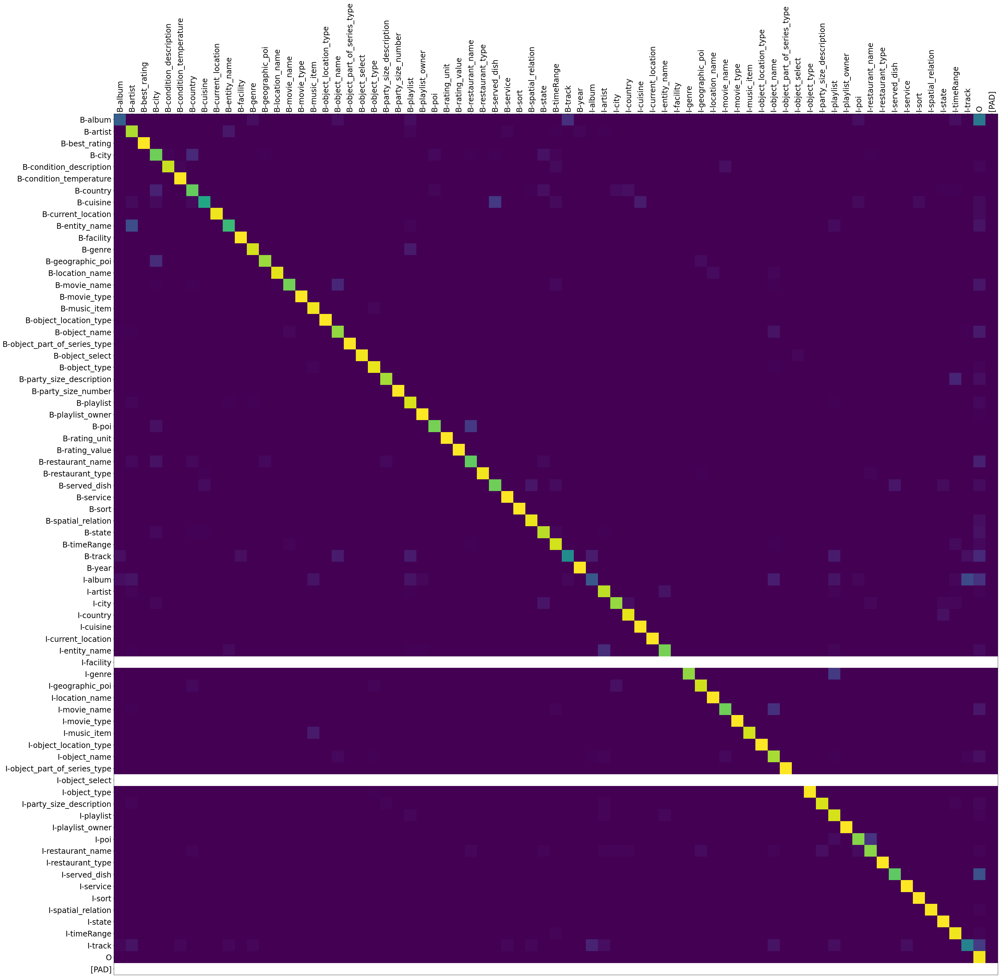

In [149]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_SNIPS')

<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

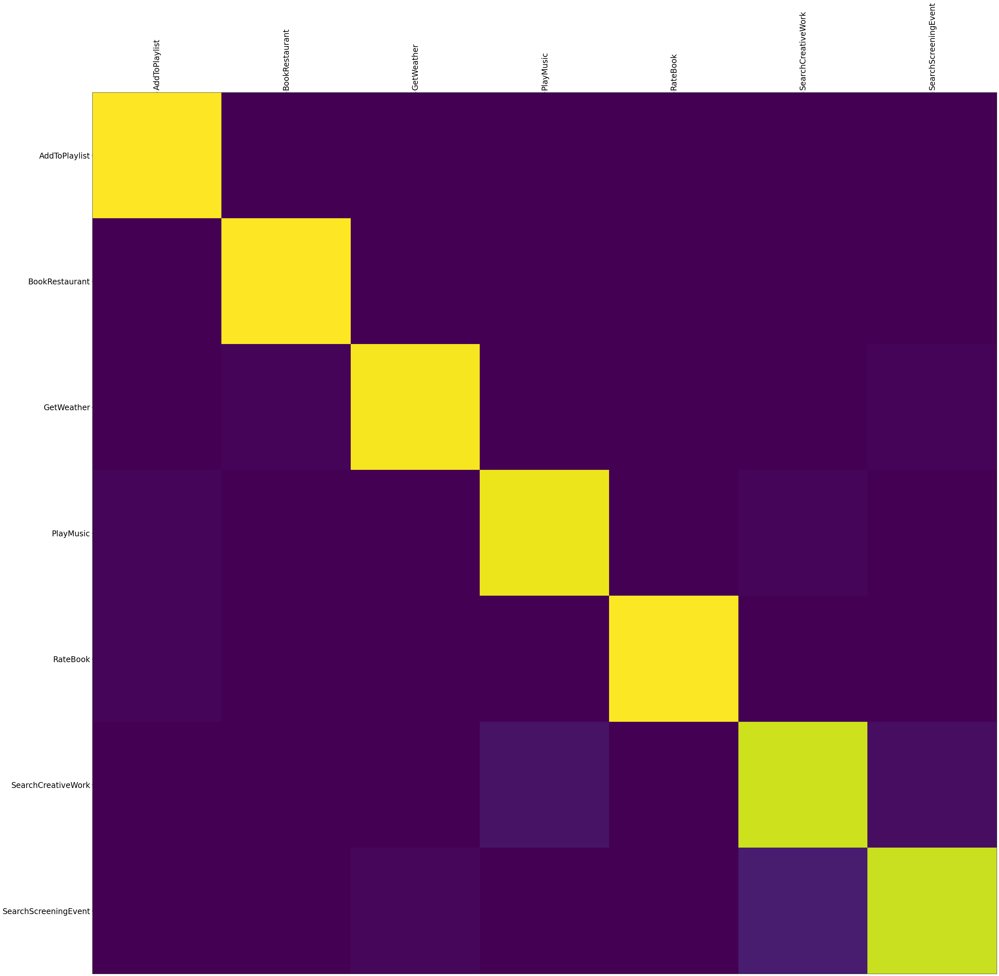

In [150]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_SNIPS')

In [151]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_SNIPS = numpy_fillna(losses_train_SNIPS)
losses_dev_SNIPS = numpy_fillna(losses_dev_SNIPS)

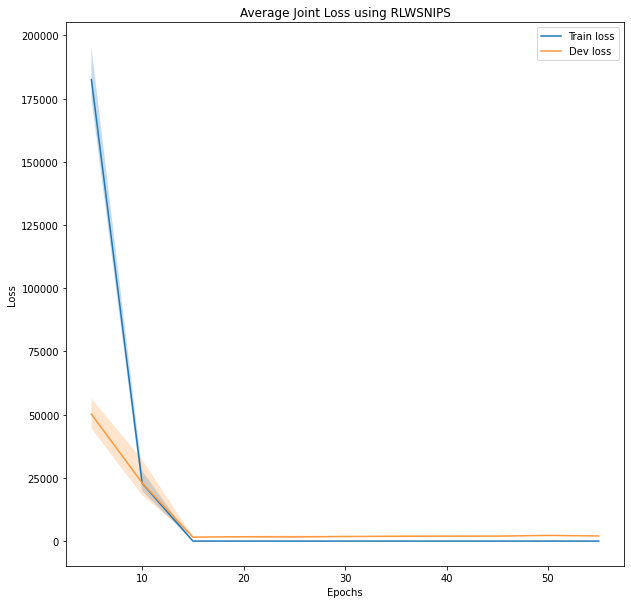

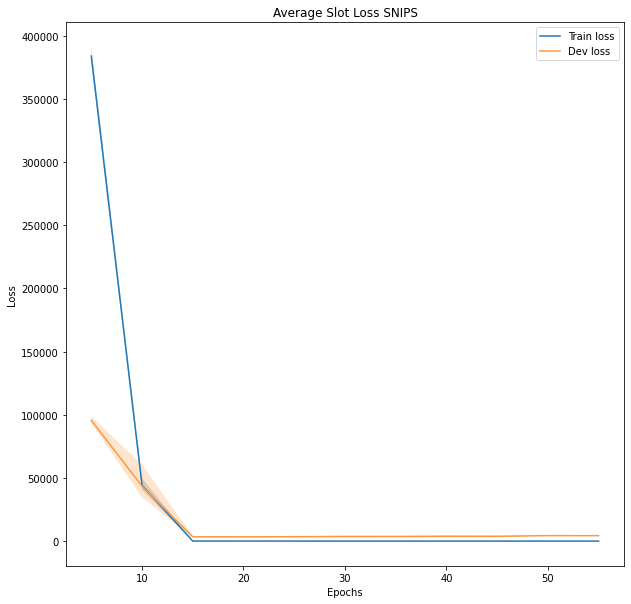

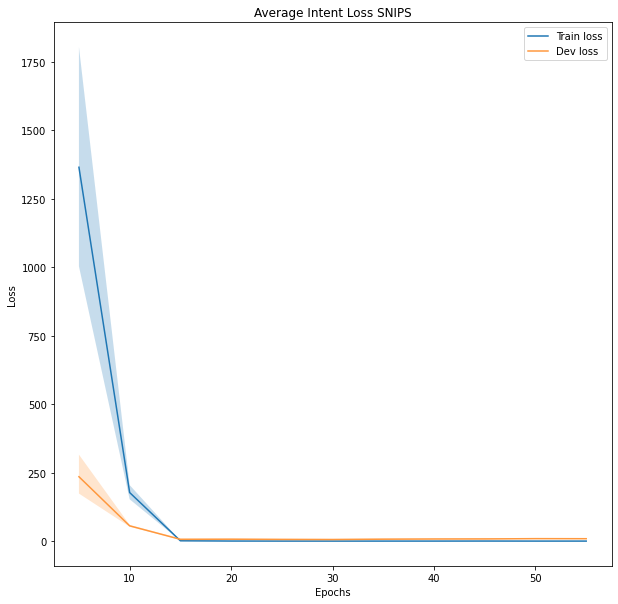

In [152]:
plot_loss(losses_train_SNIPS[:,:,0],losses_dev_SNIPS[:,:,0],sample_rate,'Average Joint Loss using RLWSNIPS')
plot_loss(losses_train_SNIPS[:,:,1],losses_dev_SNIPS[:,:,1],sample_rate,'Average Slot Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,2],losses_dev_SNIPS[:,:,2],sample_rate,'Average Intent Loss SNIPS') 

##### Errors

Check what errors the model makes

In [153]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_SNIPS,test_loader_SNIPS)

In [154]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [155]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O B-party_size_number O O O O O O B-spatial_relation O '
              'B-poi O O B-cuisine O',
 'ref_slots': 'O O O O B-party_size_number O O O O O O B-spatial_relation O '
              'B-poi O O B-restaurant_type O',
 'utterance': 'i want to bring four people to a place that s close to downtown '
              'that serves churrascaria cuisine'}


In [156]:
pprint(len(test_slot_errors))

192


In [157]:
pprint(test_intent_errors[0])

{'hyp_intent': 'PlayMusic',
 'ref_intent': 'BookRestaurant',
 'utterance': 'on june 27 2026 i d like to go to a delaware gastropub'}


In [158]:
pprint(len(test_intent_errors))

27


# Proposal 2: BERT fine tuning

Here I try to use a model based on BERT. It consists of using a pretrained model, BERT, to perform the tasks. The key idea is that both ATIS and SNIPS are too small to learn correctly the semantics of different tokens. Instead using a pretrained model on a different, vast and varied dataset, may increase our performances. Like we humans, before understanding some tasks, we need to learn language first. 



This model is based on BERT. It uses pre-trained BERT model as encoder. The encoded results are used by two fully connected heads in order to perform slot filling and intent classification.

It also uses:

- pseudo Randomly Weighted Loss
- Focal Loss

This model also uses previous hidden states in order to perform slot filling and intent classification. 

This model does not use Focal Loss as the Loss it proposes is too high. This creates a problem where in the backpropagation phase, the loss is too big and it overrides the meaningful information of the pre trained bert model.

Bert.svg

In [159]:
class ModelBertSlotIntent(nn.Module):

    def __init__(self, out_slot, out_int, lang ,bert_output = 768, pad_index=0, n_layers=4):
        super(ModelBertSlotIntent, self).__init__()
        ##out_slot = number of slots (output size for slot filling)
        ##out_int = number of intents (ouput size for intent classification)
        ##bert model to get embeddings
        self.bert = BertModel.from_pretrained("bert-base-uncased",output_hidden_states=True)
        self.bert.requires_grad_(True)
        ##append two separate layers for downstream tasks
        
        ##dropout as regularizer
        self.layer_norm_slot = nn.LayerNorm(bert_output)
        self.layer_norm_intent = nn.LayerNorm(bert_output)
        
        self.slot_out = nn.Linear(bert_output, out_slot)
        self.intent_out = nn.Linear(bert_output, out_int)

        self.dropout = nn.Dropout(0.1)
        self.n_layers = n_layers
        # tokens that are removed due to bert tokenization
        self.ignore_set = self.ignore(lang)
        
    def forward(self, utterance,seq_lengths):
        utt_emb = self.bert(utterance)
        slots = utt_emb.last_hidden_state
        # slots = self.layer_norm_slot(slots)
        # slots = self.dropout(slots)
        # slots = self.slot_fc(slots) 
        slots = self.slot_out(slots)

        ## function to remove extra tokens generated by BertTokenization
        shortened = torch.clone(slots)
        for utter,(idx,short) in zip(utterance,enumerate(slots)):
            utt = set(utter.tolist())
            intersection = utt.intersection(self.ignore_set)
            if intersection:
                # i need to remove some tokens from the slots here
                tmp = []
                for (id,token),sl in zip(enumerate(utter.tolist()),short.tolist()):
                    if token not in intersection:
                        tmp.append(sl)
                while len(tmp)<utterance.shape[1]:
                    # fill with anything, not relevant
                    tmp.append(tmp[-1])
                shortened[idx] = torch.tensor(tmp)
        slots = shortened
        slots = slots.permute(0,2,1)
        slots = slots[:,:,1:torch.max(seq_lengths)+1] # remove [CLS]

        intent = utt_emb.pooler_output
        intent = self.layer_norm_intent(intent)
        intent = self.dropout(intent)
        # intent = self.intent_fc(intent)
        intent = self.intent_out(intent) #[CLS]
        return slots,intent

    # function to extract tokens to be ignored for slot filling, because BERT tokenization creates more tokens than whitespace tokenization.
    def ignore(self,lang):
        li = set()
        for k,v in lang.word2id.items():
            if k[0:2] == "##":
                li.add(v)
        li.add(lang_bert_ATIS.word2id["'"])
        li.add(lang_bert_ATIS.word2id["'"])
        return li

In [160]:
def init_weights(mat):
    for m in mat.modules():
        if type(m) in [nn.Linear]:
            torch.nn.init.uniform_(m.weight, -0.01, 0.01)
            if m.bias != None:
                m.bias.data.fill_(0.01)

###Train Loop and Evaluation Loop
Two functions `train_loop()` and `evaluate_loop()` one for training the model and the other for evaluating it.

To compute the performances on the slot filling task it will used the evaluate function from the **conll script**, while for the intent classification **classification_report** from scikitlearn. 

In [161]:
def train_loop(data, optimizer, criterion_slots, criterion_intents,clip, model):
    '''
    function to train the model

    input
    - data : dataset
    - optimizer : optimizer 
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - model : model to be trained

    output
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    '''
    model.train()
    loss_array = []

    for sample in data:
        optimizer.zero_grad() ##Zeroing the gradient
        slots, intent = model(sample['utterances'], sample['slots_len'])
        loss_intent = criterion_intents(intent, sample['intents'])
        loss_slot = criterion_slots(slots, sample['y_slots'])
        weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
        torch.sort(weight)
        if loss_slot<loss_intent:
            loss = weight[0]*loss_slot+ weight[1]*loss_intent
        else: 
            loss = weight[0]*loss_intent+ weight[1]*loss_slot
        loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
        loss.backward() ##Compute the gradient
        ##clip the gradient to avoid explosioning gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)  
        optimizer.step() ##Update the weights
    return np.asarray(loss_array)

def eval_loop(data, criterion_slots, criterion_intents, model, lang):
    '''
    function to evaluate the model
    
    input
    - data : dataset
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - model : model to be trained
    - lang : language class Lang used for the dataset

    output
    - results_slot : evaluation of slot filling using conll evaluate,
    - report_intent: evaluation of intent classification using scikitlearn classification report,
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    - matrix_slot: confusion matrix on slot filling
    - matrix_intent confusion matrix on intent classification
    '''
    model.eval()
    loss_array = []
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    #softmax = nn.Softmax(dim=1) ##Use Softmax if you need the actual probability
    with torch.no_grad(): ##It used to avoid the creation of computational graph
        for sample in data:
            slots, intents = model(sample['utterances'], sample['slots_len'])
            loss_intent = criterion_intents(intents, sample['intents'])
            loss_slot = criterion_slots(slots, sample['y_slots'])
            weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
            torch.sort(weight)
            if loss_slot<loss_intent:
                loss = weight[0]*loss_slot+weight[1]*loss_intent
            else: 
                loss = weight[0]*loss_intent+weight[1]*loss_slot
            ##loss = loss_intent
            loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
            
            ##Intent inference
            out_intents = [lang.id2intent[x] 
                           for x in torch.argmax(intents, dim=1).tolist()] 
            gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
            ref_intents.extend(gt_intents)
            hyp_intents.extend(out_intents)
            
            ##Slot inference 
            output_slots = torch.argmax(slots, dim=1)
            for id_seq, seq in enumerate(output_slots):
                length = sample['slots_len'].tolist()[id_seq]
                # shift because [CLS] should be ignored
                utt_ids = sample['utterance'][id_seq][1:length+1].tolist()
                gt_ids = sample['y_slots'][id_seq].tolist()
                gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
                utterance = [lang.id2word[elem] for elem in utt_ids]
                to_decode = seq[:length].tolist()
                ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
                tmp_seq = []
                for id_el, elem in enumerate(to_decode):
                    ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                    tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
                hyp_slots.append(tmp_seq)
    try:            
        results_slot = evaluate(ref_slots, hyp_slots)
    except Exception as ex:
        ##Sometimes the model predics a class that is not in REF
        print(ex)
        ref_s = set([x[1] for x in ref_slots])
        hyp_s = set([x[1] for x in hyp_slots])
        print(hyp_s.difference(ref_s))
        
    report_intent = classification_report(ref_intents, hyp_intents, 
                                          zero_division=False, output_dict=True)
    
    matrix_slot = confusion_matrix([token[1] for sent in ref_slots for token in sent], [token[1] for sent in hyp_slots for token in sent],labels=list(lang.slot2id.keys()))
    matrix_intent = confusion_matrix(ref_intents, hyp_intents,labels=list(lang.intent2id.keys()))
    
    return results_slot, report_intent, np.asarray(loss_array), matrix_slot, matrix_intent


In [162]:
def train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to train a model using patience as early stopping.
    input
    - model : model to be trained
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - losses_train : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    '''
    ##list of recorded losses
    losses_train = []
    losses_dev = []
    ##list of epochs that were sampled for validation
    sampled_epochs = []
    ##early stopping on joint loss
    best_loss_slot,best_loss_intent = float('inf'),float('inf')
    ##patience
    patience_intent,patience_slot = patience,patience
    for x in tqdm(range(1,n_epochs)):
        ##train
        loss = train_loop(train_loader, optimizer, criterion_slots, criterion_intents,clip, model)
        ##every sample rate
        if x % sample_rate == 0:
            ##record epoch
            sampled_epochs.append(x)
            ##record losses on train ( 3 loss array)
            losses_train.append(loss.mean(axis=0))
            ##record losses on dev (3 loss array )
            slot_dev, intent_dev, loss_dev,_,_ = eval_loop(dev_loader, criterion_slots, criterion_intents, model, lang)
            losses_dev.append(loss_dev.mean(axis=0))
            ##early stopping considering mean joint loss on dev set
            if loss_dev.mean(axis=0)[1] < best_loss_slot:
                best_loss_slot = loss_dev.mean(axis=0)[1]
            else:
                patience_slot -= 1
            if loss_dev.mean(axis=0)[2] < best_loss_intent:
                best_loss_intent = loss_dev.mean(axis=0)[2]
            else:
                patience_intent -= 1
            if patience_slot <= 0 and patience_intent <=0:
            # if patience_intent <=0:
                break 
    return losses_train,losses_dev

In [163]:
def train_multiple(runs,lang,n_epochs,train_loader,dev_loader,test_loader,criterion_slots,criterion_intents,n_layers,clip,patience,sample_rate):
    '''
    function to a model using patience as early stopping multiple times
    input
    - runs: number of runs
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - test_loader : test set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - models : list of models trained
    - results_slots : a list of evaluation of slot filling using conll evaluate of length runs,
    - reports_intents: a list of evaluation of intent classification using scikitlearn classification report of length runs,
    - losses_train_mul : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev_mul : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - matrix_slot: a list of confusion matrixes on slot filling of length runs
    - matrix_intent: a list confusion matrixes on intent classification of length runs
    '''
    out_slot = len(lang.slot2id)
    out_int = len(lang.intent2id)
    vocab_len = len(lang.word2id)
    ##list of test results
    results_slots, results_intents = [],[]
    ##list of losses through the run
    losses_train_mul = []
    losses_dev_mul = []
    ##models
    models = []
    slot_matrix = np.zeros((runs,out_slot,out_slot))
    intent_matrix = np.zeros((runs,out_int,out_int))
    for x in range(0, runs):
        model = ModelBertSlotIntent(out_slot, out_int,lang, 768,pad_index=PAD_TOKEN,n_layers=n_layers).to(device)
        model.apply(init_weights)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        ##train
        losses_train,losses_dev = train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate)
        losses_train_mul.append(losses_train)
        losses_dev_mul.append(losses_dev)
        ##test results
        slot_test, intent_test, loss_test, slot_m, intent_m = eval_loop(test_loader, criterion_slots, criterion_intents, model, lang)
        slot_matrix[x] += slot_m
        intent_matrix[x] += intent_m
        results_slots.append(slot_test)
        results_intents.append(intent_test)
        models.append(model)
    return models,results_slots,results_intents,losses_train_mul,losses_dev_mul,slot_matrix,intent_matrix

In [164]:
# error function to test the model and sample the predictions used for error
def eval_loop_complete(model, lang, data):
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    for sample in data:
        ##Intent inference
        slots,intents = model.forward(sample['utterances'],sample['slots_len'])

        out_intents = [lang.id2intent[x] 
                        for x in torch.argmax(intents, dim=1).tolist()] 
        gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
        ref_intents.extend(gt_intents)
        hyp_intents.extend(out_intents)

        ##Slot inference 
        output_slots = torch.argmax(slots, dim=1)
        for id_seq, seq in enumerate(output_slots):
            length = sample['slots_len'].tolist()[id_seq]
            # i need ignore the [CLS] and [SEP] tokens!
            utt_ids = sample['utterance'][id_seq][1:length+1].tolist()
            gt_ids = sample['y_slots'][id_seq].tolist()
            gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
            utterance = [lang.id2word[elem] for elem in utt_ids]
            to_decode = seq[:length].tolist()
            ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
            tmp_seq = []
            for id_el, elem in enumerate(to_decode):
                ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
            hyp_slots.append(tmp_seq)
    return ref_slots,hyp_slots,ref_intents,hyp_intents,
                

###Training

To have reliable results on small corpora train and test the model will be done several times over. At the end, the results are averaged.

In [165]:
##parameters for training
lr = 0.00005 ##learning rate
clip = 5 ##Clip the gradient
runs = 1 ##runs
n_epochs = 200 ##epochs for each run
patience_max = 5 ##patience for early stopping for each run. Computed every sample_rate steps
sample_rate = 3
n_layers = 1

# criterion_slots = nn.CrossEntropyLoss(ignore_index=PAD_TOKEN)
# criterion_intents =  nn.CrossEntropyLoss()
criterion_slots = FocalLoss(gamma=2,reduction='sum',ignore_index=PAD_TOKEN)
criterion_intents =  FocalLoss(gamma=2,reduction='sum')

####ATIS

Train multiple times on ATIS

In [166]:
models, slot_test_ATIS,intent_test_ATIS,losses_train_ATIS,losses_dev_ATIS, slot_matrix_ATIS, intent_matrix_ATIS, = train_multiple(runs,lang_bert_ATIS,n_epochs,train_loader_bert_ATIS,dev_loader_bert_ATIS,test_loader_bert_ATIS,criterion_slots,criterion_intents,n_layers,clip,patience_max,sample_rate)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 31%|███       | 62/199 [18:39<41:13, 18.05s/it]


#####Results

In [167]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_ATIS)

Display results on slot filling task

In [168]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
depart_date.year,1.00,1.0,1.00,3.0
days_code,1.00,1.0,1.00,1.0
economy,1.00,1.0,1.00,6.0
flight_days,1.00,1.0,1.00,10.0
class_type,0.96,1.0,0.98,24.0
...,...,...,...,...
stoploc.airport_code,1.00,0.0,0.00,1.0
return_date.day_name,1.00,0.0,0.00,2.0
flight,1.00,0.0,0.00,1.0
booking_class,1.00,0.0,0.00,1.0


Display results on intent classification task

In [169]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
airport,1.000,1.000,1.000,18.0
ground_service,0.973,1.000,0.986,36.0
flight,0.983,0.984,0.983,632.0
abbreviation,1.000,0.909,0.952,33.0
distance,1.000,0.900,0.947,10.0
weighted avg,0.947,0.947,0.942,893.0
airline,0.884,1.000,0.938,38.0
airfare,0.873,1.000,0.932,48.0
ground_fare,1.000,0.857,0.923,7.0
flight_no,0.800,1.000,0.889,8.0


In [170]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9473684210526315


In [171]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.866689993 +- 0.0
Intent Acc 0.947368421 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

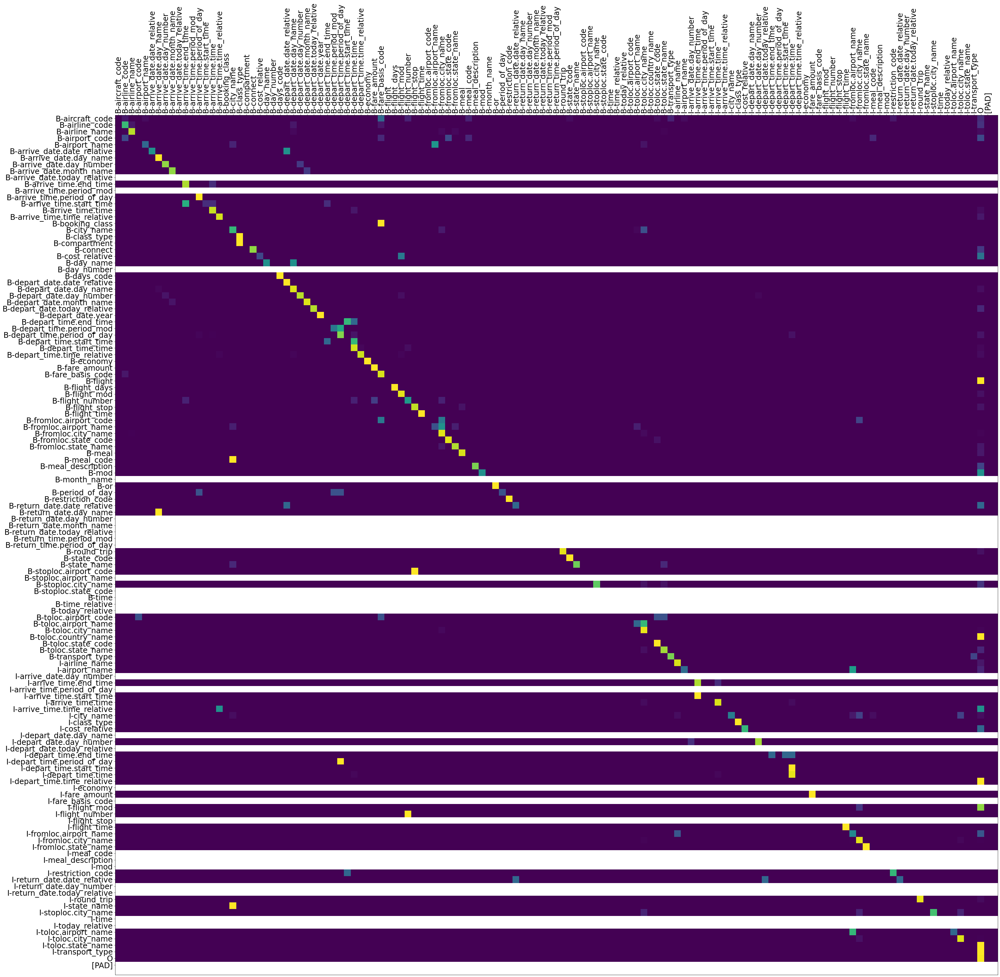

In [172]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

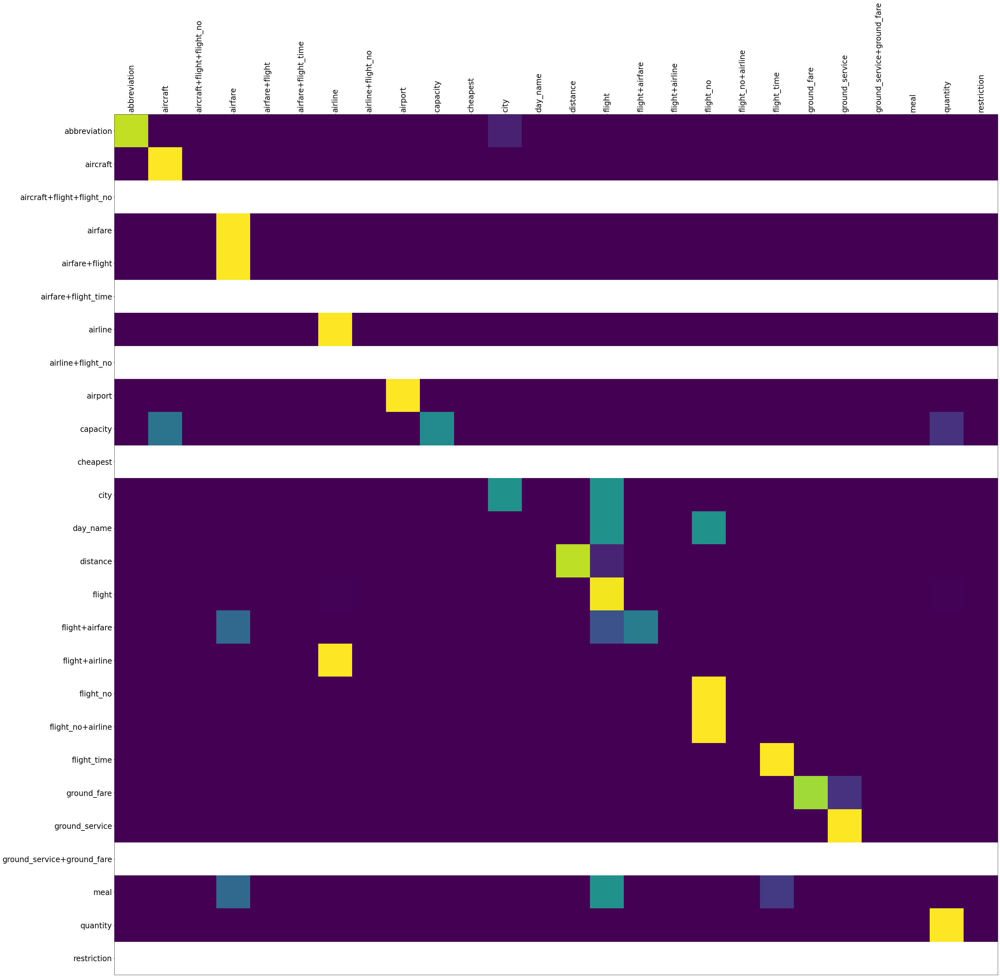

In [173]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_ATIS')

In [174]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_ATIS)

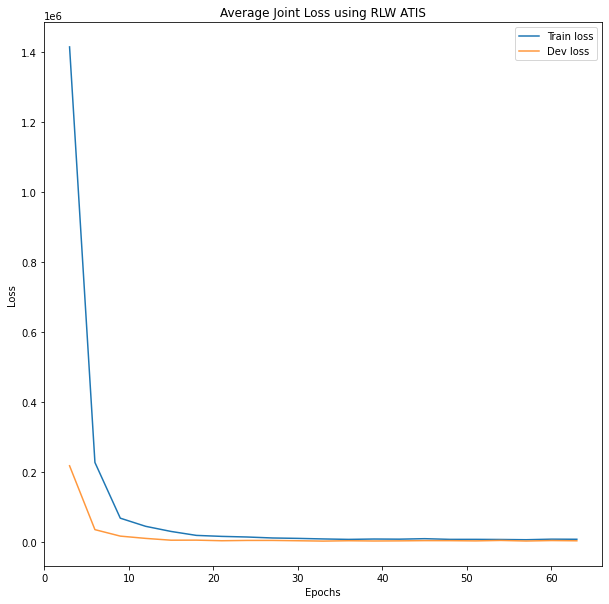

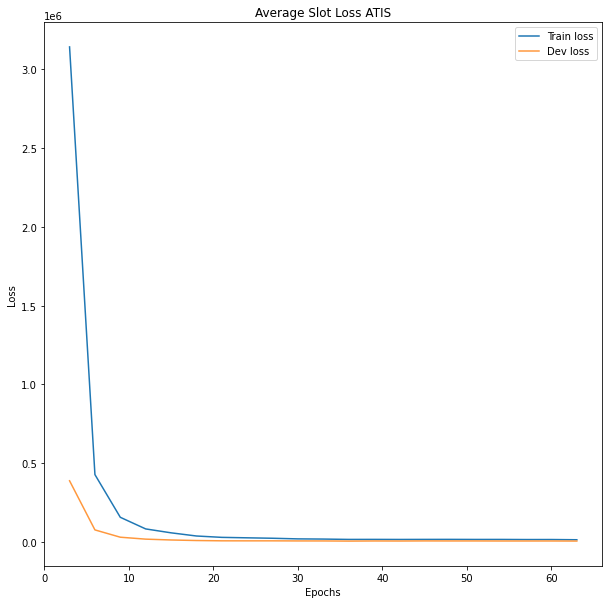

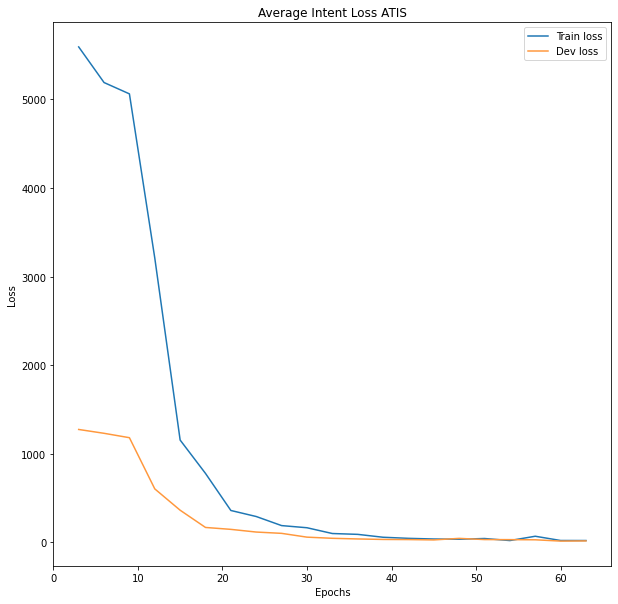

In [175]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss using RLW ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [176]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_bert_ATIS,test_loader_bert_ATIS)

In [177]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [178]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [179]:
pprint(len(test_slot_errors))

269


In [180]:
pprint(test_intent_errors[0])

{'hyp_intent': 'airfare',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [181]:
pprint(len(test_intent_errors))

47


#### Remix ATIS

Here is tried a new divison of ATIS, but more balanced, in order to avoid the case of having labels that are present in the test set but not in the train or dev sets.

Train multiple times on remix ATIS

In [182]:
models, slot_test_remix_ATIS,intent_test_remix_ATIS,losses_train_remix_ATIS,losses_dev_remix_ATIS, slot_matrix_remix_ATIS, intent_matrix_remix_ATIS, = train_multiple(runs,lang_bert_ATIS,n_epochs,train_loader_bert_remix_ATIS,dev_loader_bert_remix_ATIS,test_loader_bert_remix_ATIS,criterion_slots,criterion_intents,n_layers,clip,patience_max,sample_rate)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 28%|██▊       | 56/199 [16:42<42:39, 17.90s/it]


#####Results

In [183]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [184]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
depart_date.year,1.0,1.0,1.0,2.0
days_code,1.0,1.0,1.0,1.0
state_name,1.0,1.0,1.0,1.0
meal,1.0,1.0,1.0,13.0
day_name,1.0,1.0,1.0,1.0
...,...,...,...,...
return_date.day_number,1.0,0.0,0.0,1.0
airport_code,1.0,0.0,0.0,7.0
stoploc.state_code,1.0,0.0,0.0,1.0
return_date.month_name,1.0,0.0,0.0,1.0


Display results on intent classification task

In [185]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
flight,0.992,0.982,0.987,655.0
weighted avg,0.973,0.969,0.969,893.0
airfare,0.959,0.972,0.966,72.0
ground_service,1.000,0.932,0.965,44.0
abbreviation,0.931,1.000,0.964,27.0
aircraft,1.000,0.929,0.963,14.0
airline,0.857,1.000,0.923,30.0
capacity,1.000,0.833,0.909,6.0
ground_fare,0.800,1.000,0.889,4.0
distance,1.000,0.750,0.857,4.0


In [186]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9686450167973124


In [187]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.898406375 +- 0.0
Intent Acc 0.968645017 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

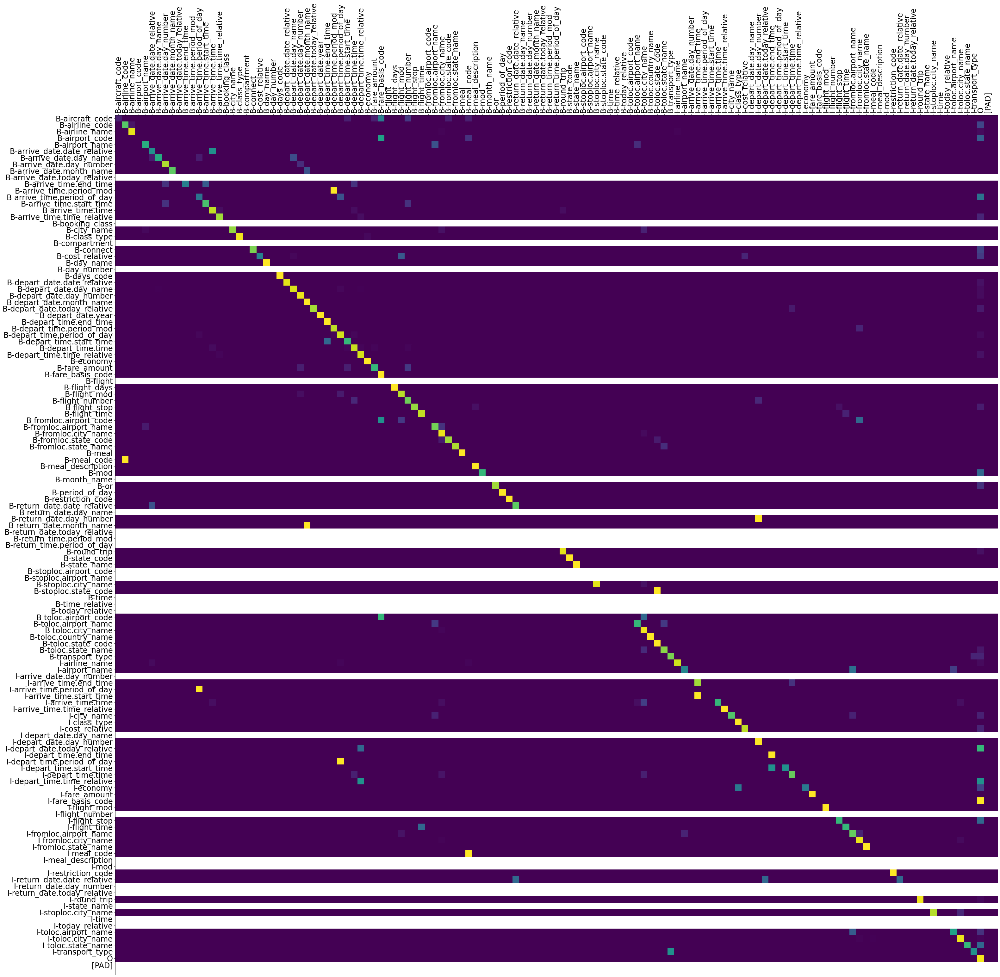

In [188]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_ATIS_norm = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_norm/ slot_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

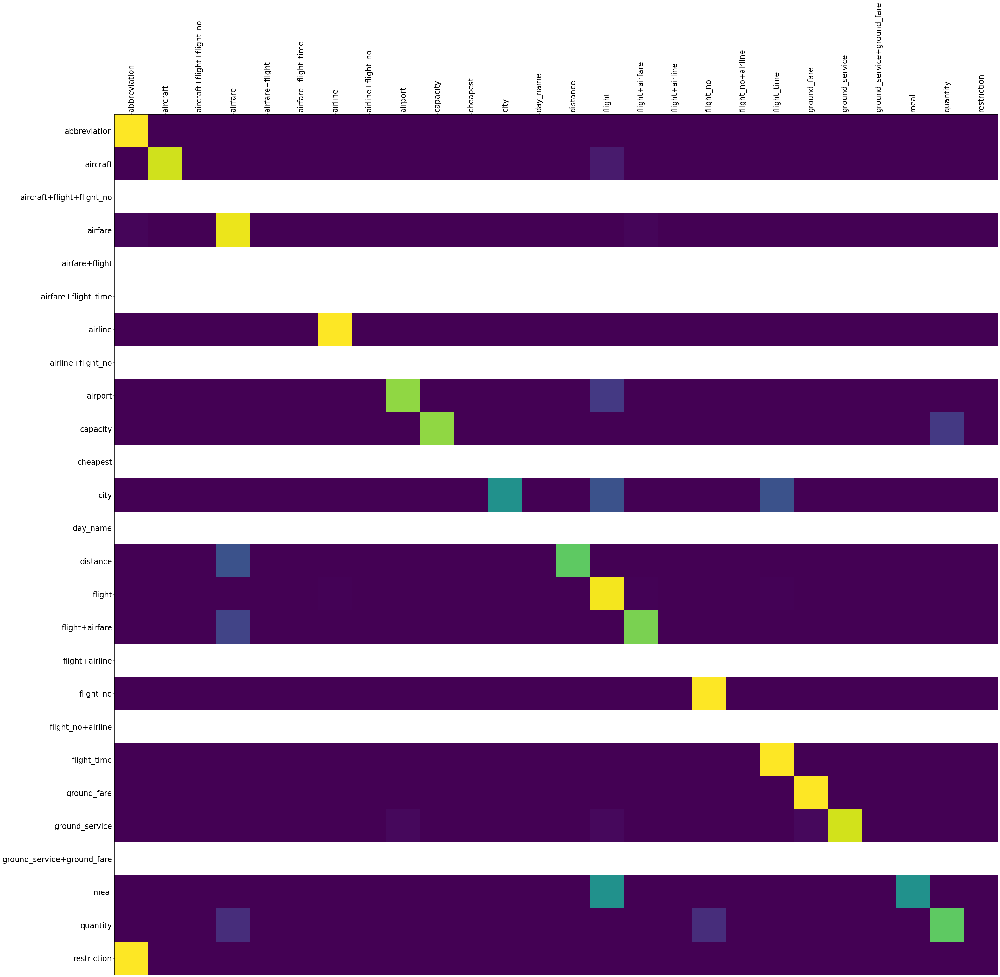

In [189]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_ATIS_norm = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_norm/ intent_matrix_ATIS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.viridis)
labels = lang_ATIS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_remix_ATIS')

In [190]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

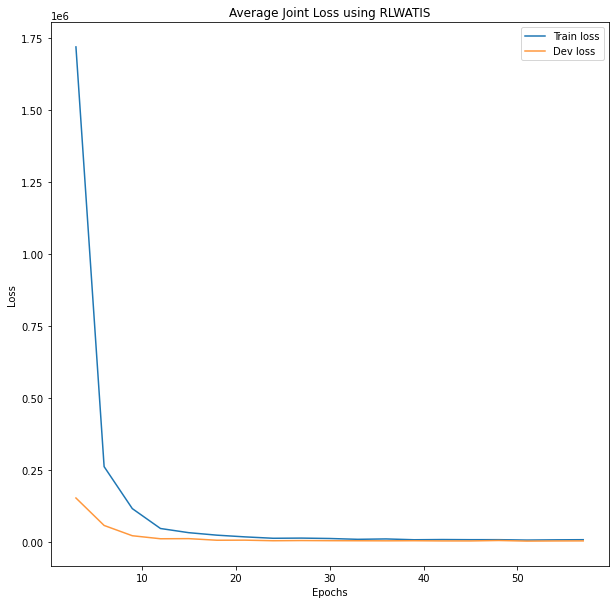

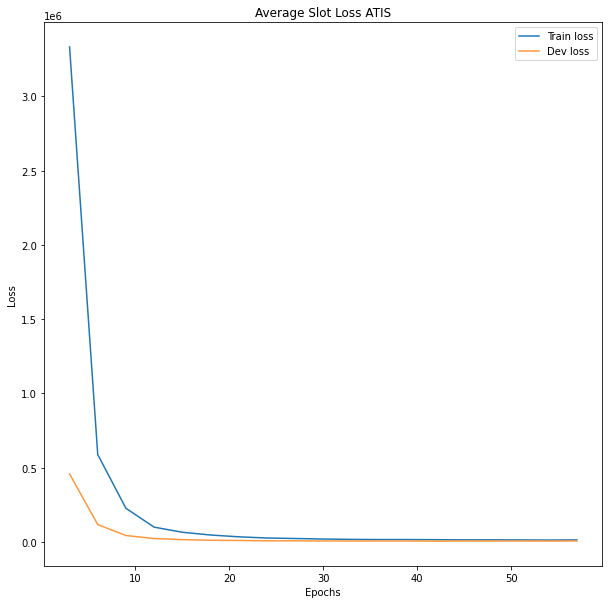

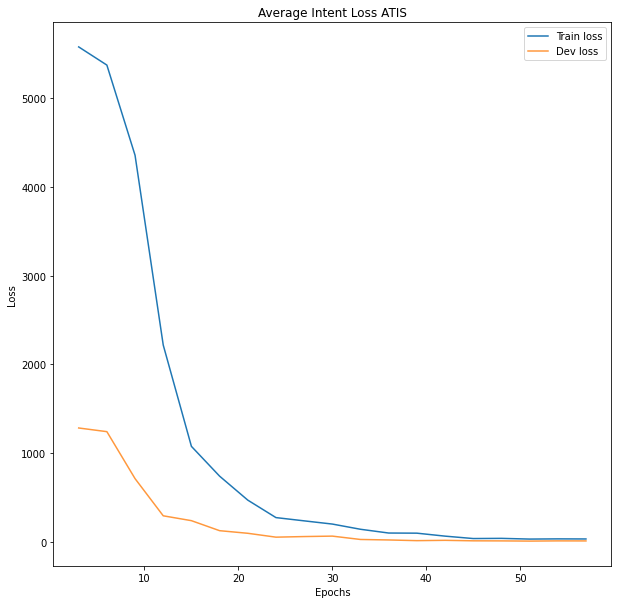

In [191]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss using RLWATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [192]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_bert_ATIS,test_loader_bert_remix_ATIS)

In [193]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [194]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O O O O O B-fromloc.city_name I-fromloc.city_name O '
              'B-toloc.city_name I-toloc.city_name I-toloc.city_name O '
              'B-airline_name O O O B-arrive_time.time_relative '
              'B-arrive_time.time B-fromloc.city_name '
              'B-depart_time.period_of_day O O B-depart_time.period_of_day O O '
              'O O O O O O O O O O',
 'ref_slots': 'O O O O O O O O B-fromloc.city_name I-fromloc.city_name O '
              'B-toloc.city_name I-toloc.city_name I-toloc.city_name O '
              'B-airline_name O O O B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O '
              'B-arrive_time.period_of_day O O O O O O O O O O O O O',
 'utterance': 'i would like to find a flight from kansas city to salt lake '
              "city on delta and arriving at about 8 o ' clock in the evening "
              'could you please tell me the aircraft and the flight number'}


In [195]:
pprint(len(test_slot_errors))

239


In [196]:
pprint(test_intent_errors[0])

{'hyp_intent': 'abbreviation',
 'ref_intent': 'airfare',
 'utterance': 'display all fare codes'}


In [197]:
pprint(len(test_intent_errors))

28


In [198]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [199]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
depart_date.year,1.0,1.0,1.0,2.0
days_code,1.0,1.0,1.0,1.0
state_name,1.0,1.0,1.0,1.0
meal,1.0,1.0,1.0,13.0
day_name,1.0,1.0,1.0,1.0
...,...,...,...,...
return_date.day_number,1.0,0.0,0.0,1.0
airport_code,1.0,0.0,0.0,7.0
stoploc.state_code,1.0,0.0,0.0,1.0
return_date.month_name,1.0,0.0,0.0,1.0


Display results on intent classification task

In [200]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
flight,0.992,0.982,0.987,655.0
weighted avg,0.973,0.969,0.969,893.0
airfare,0.959,0.972,0.966,72.0
ground_service,1.000,0.932,0.965,44.0
abbreviation,0.931,1.000,0.964,27.0
aircraft,1.000,0.929,0.963,14.0
airline,0.857,1.000,0.923,30.0
capacity,1.000,0.833,0.909,6.0
ground_fare,0.800,1.000,0.889,4.0
distance,1.000,0.750,0.857,4.0


In [201]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9686450167973124


In [202]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.898406375 +- 0.0
Intent Acc 0.968645017 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

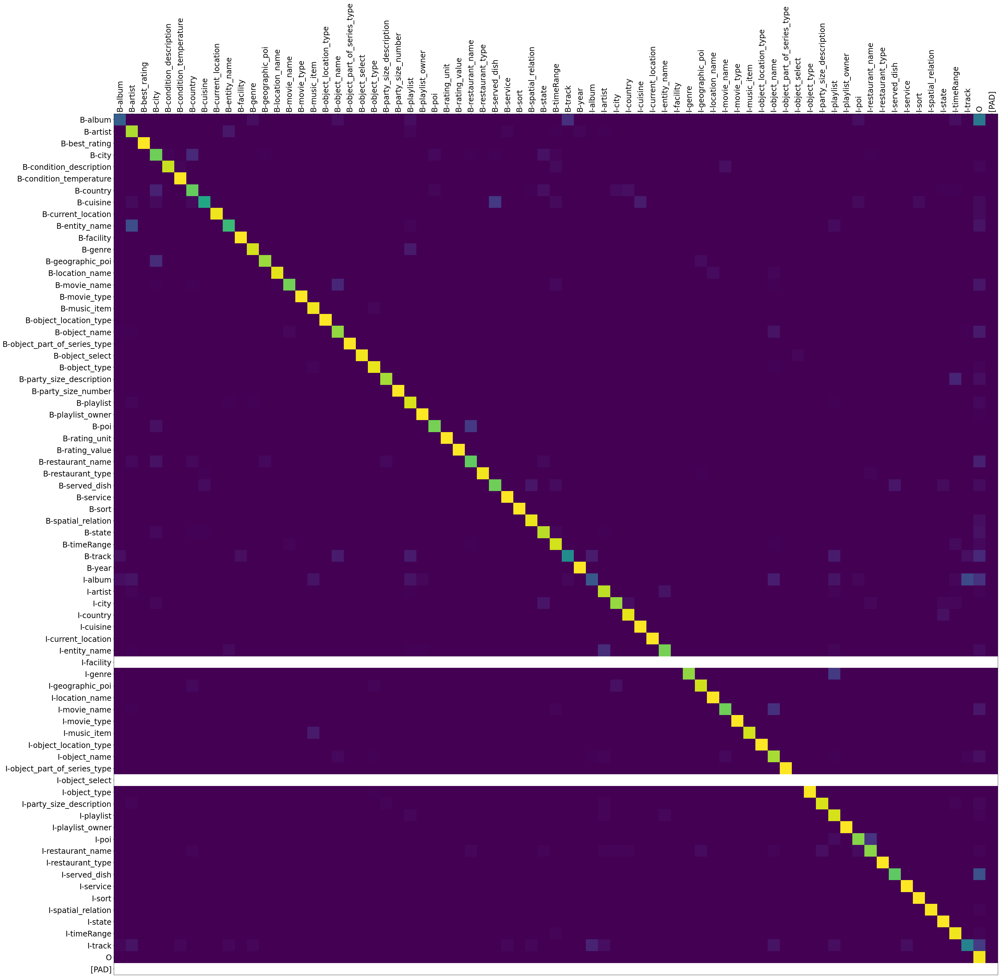

In [203]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_SNIPS')

<Figure size 432x288 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

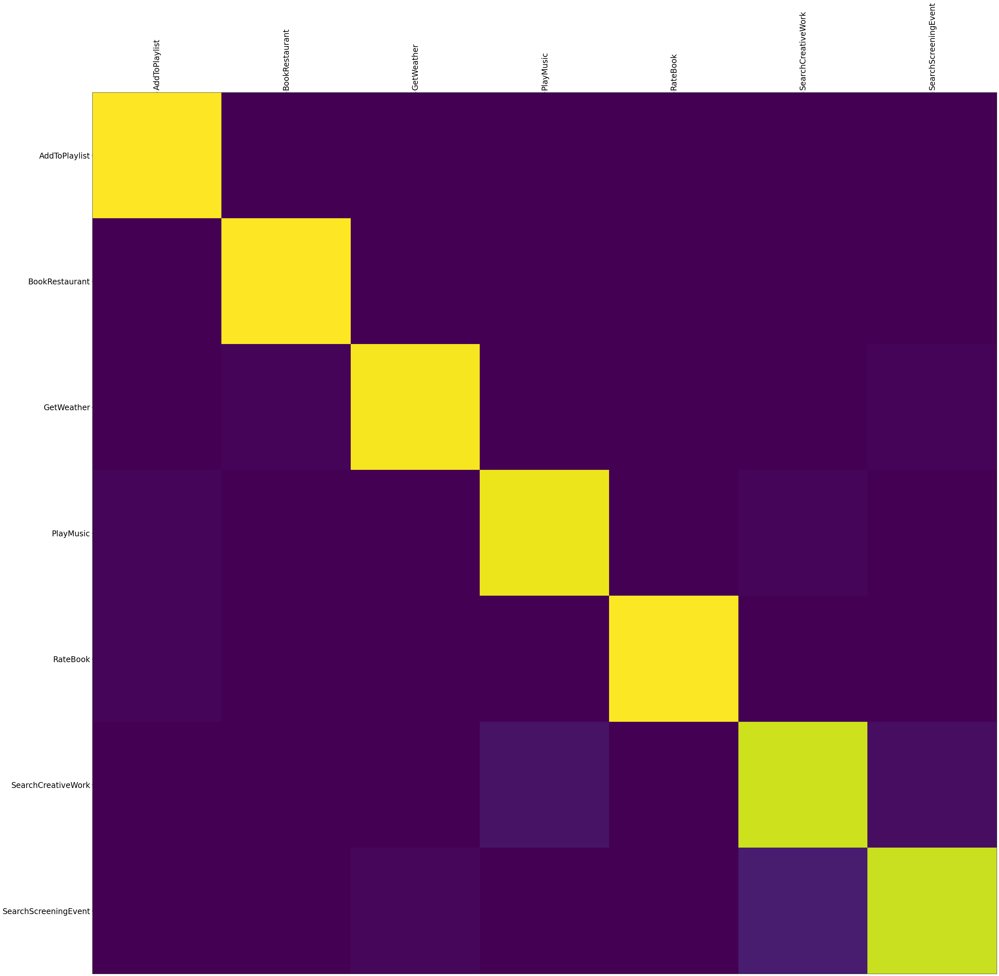

In [204]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_SNIPS')

In [205]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

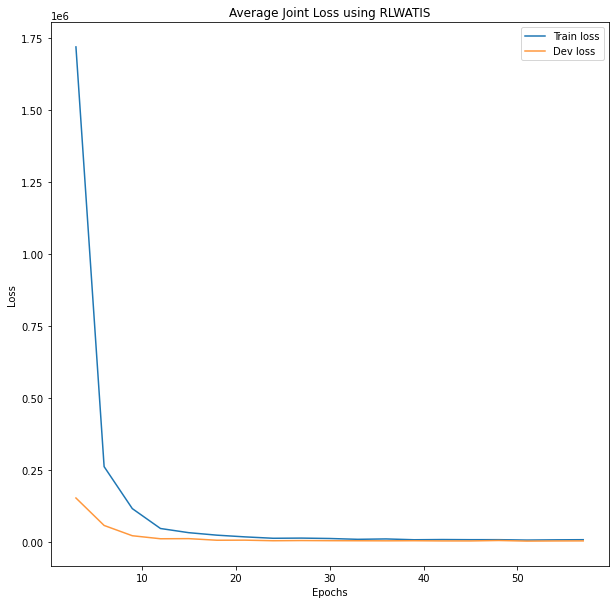

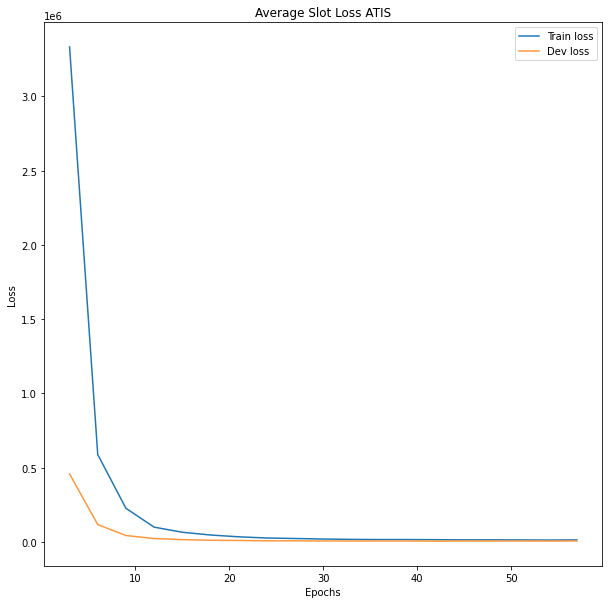

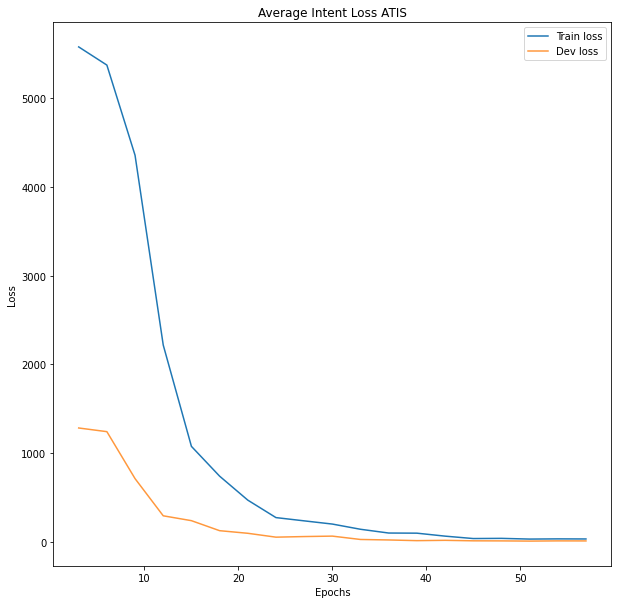

In [206]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Average Joint Loss using RLWATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Average Intent Loss ATIS') 

####SNIPS

Train multiple times on SNIPS

In [207]:
models, slot_test_SNIPS,intent_test_SNIPS,losses_train_SNIPS,losses_dev_SNIPS, slot_matrix_SNIPS, intent_matrix_SNIPS, = train_multiple(runs,lang_bert_SNIPS,n_epochs,train_loader_bert_SNIPS,dev_loader_bert_SNIPS,test_loader_bert_SNIPS,criterion_slots,criterion_intents,n_layers,clip,patience_max,sample_rate)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 21%|██        | 41/199 [28:38<1:50:21, 41.91s/it]


#####Results

In [208]:
##average the results over multiple runs
slot_test_SNIPS_mean = result_mean(slot_test_SNIPS)
intent_test_SNIPS_mean = result_mean(intent_test_SNIPS)

Display results on slot filling task

In [209]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_SNIPS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
current_location,1.000,1.000,1.000,14.0
object_select,1.000,1.000,1.000,40.0
rating_unit,1.000,1.000,1.000,40.0
best_rating,1.000,0.977,0.988,43.0
rating_value,0.963,0.988,0.975,80.0
movie_type,0.970,0.970,0.970,33.0
object_type,0.951,0.963,0.957,162.0
music_item,0.935,0.962,0.948,104.0
object_location_type,0.913,0.955,0.933,22.0
condition_description,0.926,0.893,0.909,28.0


Display results on intent classification task

In [210]:
intent_test_SNIPS_mean_no_acc = deepcopy(intent_test_SNIPS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_SNIPS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_SNIPS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
AddToPlaylist,0.984,0.992,0.988,124.0
GetWeather,1.000,0.971,0.985,104.0
BookRestaurant,0.978,0.978,0.978,92.0
RateBook,0.963,0.988,0.975,80.0
weighted avg,0.965,0.964,0.964,700.0
macro avg,0.963,0.965,0.964,700.0
SearchScreeningEvent,0.945,0.963,0.954,107.0
PlayMusic,0.914,0.988,0.950,86.0
SearchCreativeWork,0.959,0.879,0.917,107.0


In [211]:
pprint(intent_test_SNIPS_mean['accuracy'])

0.9642857142857143


In [212]:
slot_f1s_SNIPS = np.asarray([f['total']['f'] for f in slot_test_SNIPS])
intent_acc_SNIPS = np.asarray([f['accuracy'] for f in intent_test_SNIPS])
print('Slot F1', round(slot_f1s_SNIPS.mean(),9), '+-', round(slot_f1s_SNIPS.std(),9))
print('Intent Acc', round(intent_acc_SNIPS.mean(), 9), '+-', round(intent_acc_SNIPS.std(), 9))

Slot F1 0.692030848 +- 0.0
Intent Acc 0.964285714 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


<Figure size 432x288 with 0 Axes>

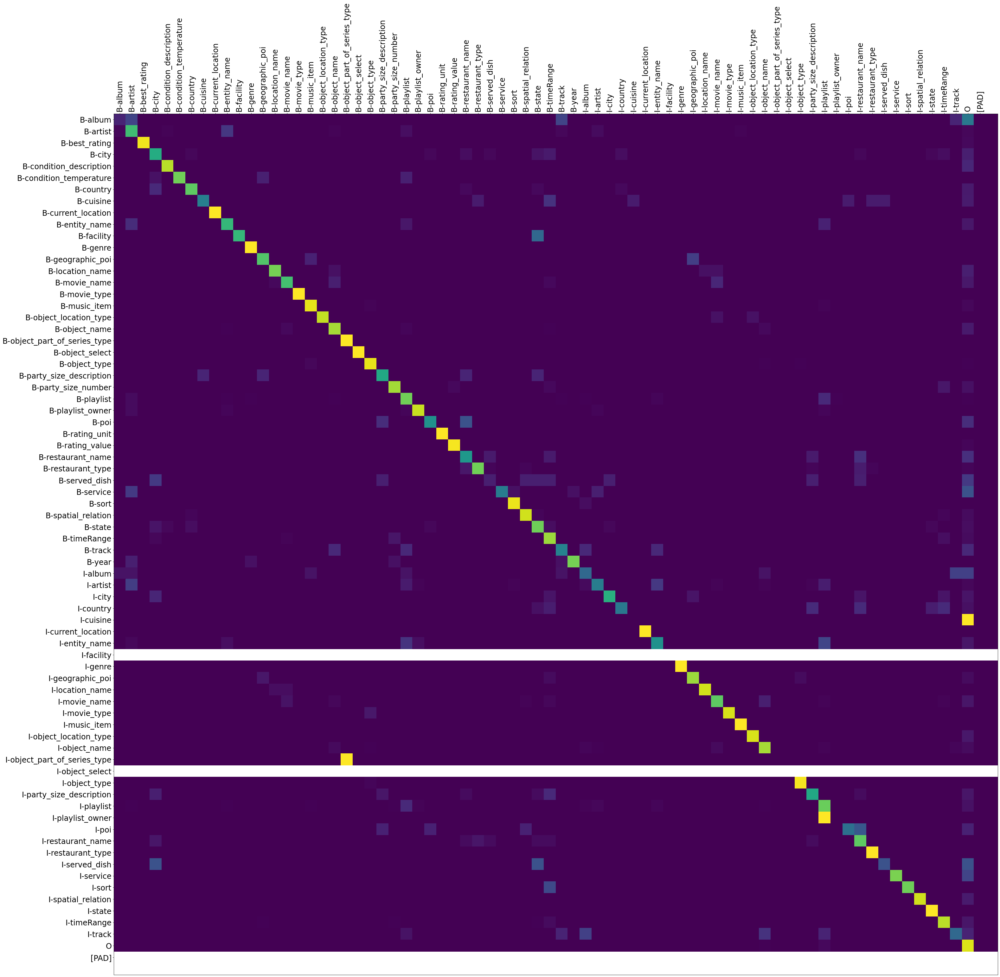

In [213]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
slot_matrix_SNIPS_norm = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_norm/ slot_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.slot2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=24,rotation=0)
plt.gca().invert_yaxis()

<Figure size 432x288 with 0 Axes>

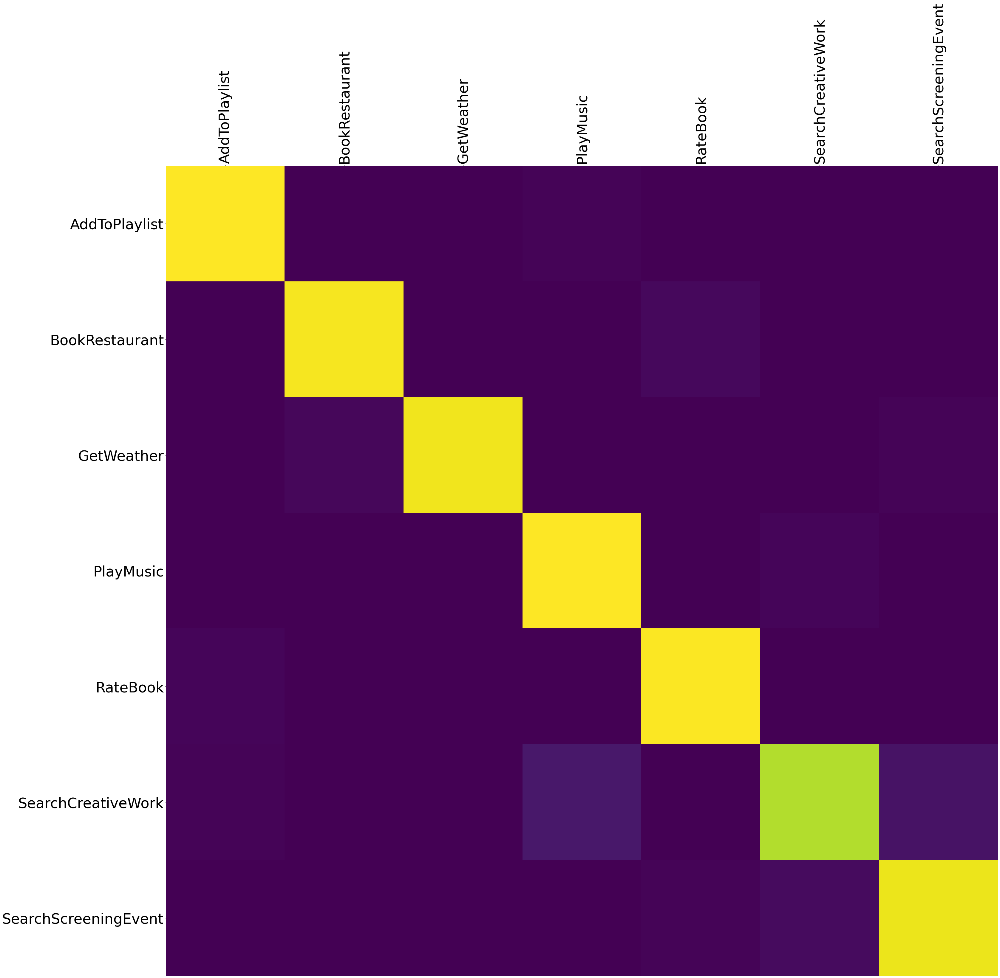

In [214]:
plt.clf()
fig, ax = plt.subplots(figsize = (50,50))
intent_matrix_SNIPS_norm = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_norm/ intent_matrix_SNIPS_norm.sum(axis=1)[:, np.newaxis]
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.viridis)
labels = lang_SNIPS.intent2id.keys()
ax.xaxis.set_ticks_position('top')
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=48,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=48,rotation=0)
plt.gca().invert_yaxis()

In [215]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_SNIPS = numpy_fillna(losses_train_SNIPS)
losses_dev_SNIPS = numpy_fillna(losses_dev_SNIPS)

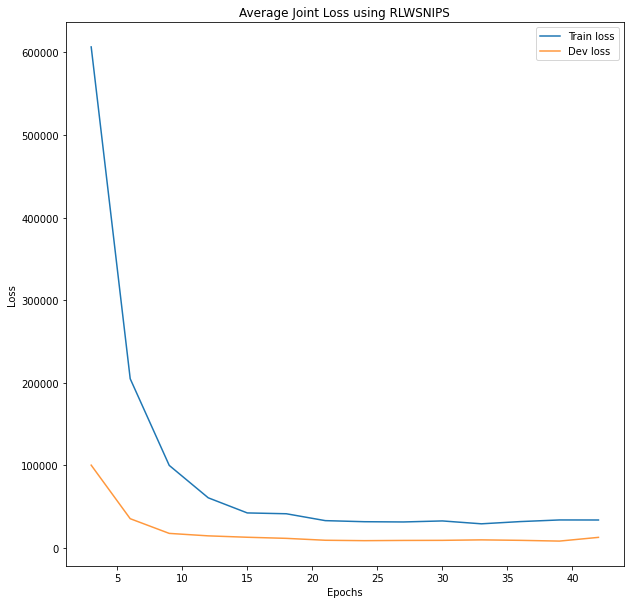

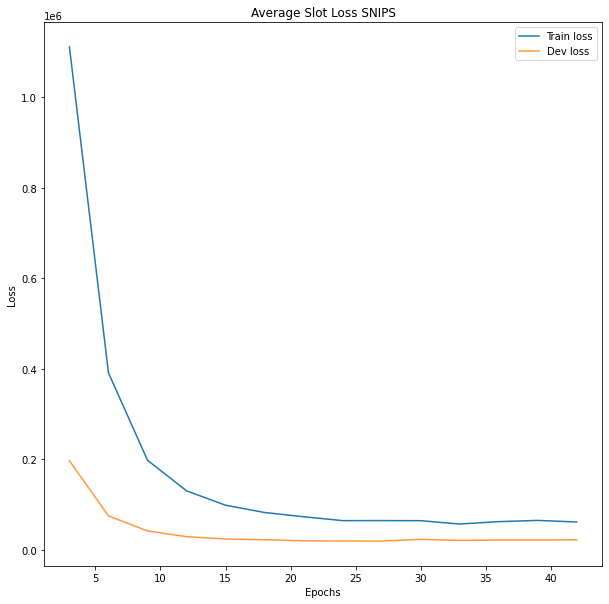

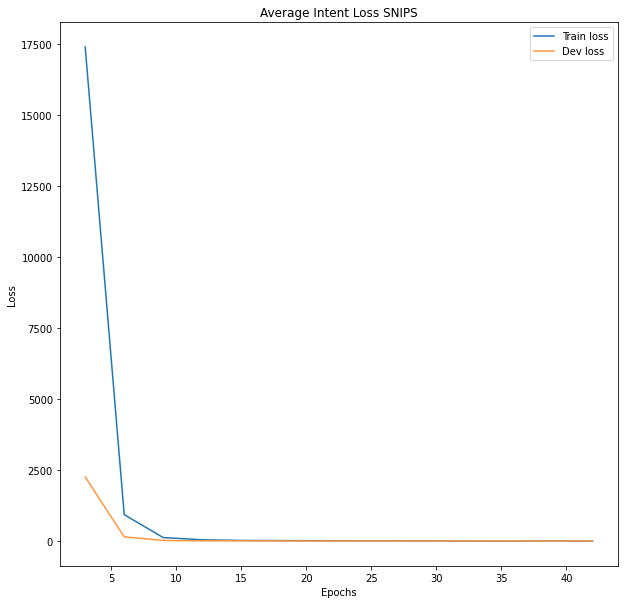

In [216]:
plot_loss(losses_train_SNIPS[:,:,0],losses_dev_SNIPS[:,:,0],sample_rate,'Average Joint Loss using RLWSNIPS')
plot_loss(losses_train_SNIPS[:,:,1],losses_dev_SNIPS[:,:,1],sample_rate,'Average Slot Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,2],losses_dev_SNIPS[:,:,2],sample_rate,'Average Intent Loss SNIPS') 

##### Errors

Check what errors the model makes

In [217]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_bert_SNIPS,test_loader_bert_SNIPS)

In [218]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [219]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O O O O O O I-geographic_poi I-geographic_poi '
              'I-geographic_poi I-geographic_poi I-geographic_poi '
              'I-geographic_poi O B-timeRange I-timeRange I-timeRange '
              'B-timeRange',
 'ref_slots': 'O O O O O O O O O B-geographic_poi I-geographic_poi '
              'I-geographic_poi I-geographic_poi I-geographic_poi '
              'I-geographic_poi O B-timeRange I-timeRange I-timeRange '
              'I-timeRange',
 'utterance': 'what is the weather going to be like in k ##lon ##di ##ke gold '
              'rush national historical park on february'}


In [220]:
pprint(len(test_slot_errors))

355


In [221]:
pprint(test_intent_errors[0])

{'hyp_intent': 'RateBook',
 'ref_intent': 'SearchScreeningEvent',
 'utterance': 'in one hour find king of hearts'}


In [222]:
pprint(len(test_intent_errors))

25
